# Dependencies and files

## Imports

In [1]:
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import gseapy
import os
import glob
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm

# Global variables

## Load files

### Load clusters

Load clusters for human-specific genes

In [2]:
cluster_groups = pd.read_csv('../../Specie-specific genes/results/human_clusters_edgeR_6.csv', index_col=0)
cluster_groups.columns = ['label']
cluster_groups.head()

,label
LPL,0
SCN3B,0
RGS2,0
KIF21B,0
ST3GAL5,0


Load human/age-specific genes

In [3]:
hs_groups = pd.read_csv('../../Specie-specific genes/results/age_hs_groups.csv', index_col=0)
hs_groups.head()

,label
LDHB,age-specific
NRXN2,age-specific
NDUFB10,age-specific
ZBTB46,age-specific
ASAP2,age-specific


In [4]:
human_specific_genes = cluster_groups.index.to_list()
human_specific_genes[:5]

['LPL', 'SCN3B', 'RGS2', 'KIF21B', 'ST3GAL5']

### Load EdgeR results

In [5]:
dirpath = 'results/DE_sup'
res_edgeR = dict()

for file in os.listdir(dirpath):
    # read celltype name
    celltype = file.rstrip('.csv').lstrip('degenes_')
    # read DE results to DataFrame
    df = pd.read_csv(f'{dirpath}/{file}', index_col=0).reset_index(names='names')
    # add a direction to the F-score
    #df['score'] =  np.log1p(df['F'] * np.heaviside(df['F'], 0)) * np.sign(df['logFC'])
    df['score'] =  df['F'] * np.heaviside(df['F'], 0) * np.sign(df['logFC'])
    # save to the dict
    res_edgeR[celltype] = df

res_edgeR.keys()

dict_keys(['Astrocyte', 'CGE interneuron', 'Deep-layer corticothalamic and 6b', 'Deep-layer intratelencephali', 'Deep-layer near-projecting', 'LAMP5-LHX6 and Chandelier', 'MGE interneuron', 'Microglia', 'Miscellaneou', 'Oligodendrocyte precursor', 'Oligodendrocyte', 'Upper-layer intratelencephali'])

In [6]:
res_edgeR['Astrocyte'].head()

,names,logFC,logCPM,F,PValue,FDR,score
0,GLUD1,3.397732,7.636025,16431.812032,6.796474e-225,1.049647e-220,16431.812032
1,LRIG1,4.226135,7.298702,9896.307887,4.691220e-206,3.622560e-202,9896.307887
2,ADGRV1,7.183472,8.325861,18209.161644,4.137428e-197,2.129948e-193,18209.161644
3,ATP13A4,5.141511,7.270595,25369.968870,2.149450e-196,8.299026e-193,25369.968870
4,ZNRF3,4.325800,7.677004,12588.022602,1.257685e-194,3.884737e-191,12588.022602


In [7]:
# annot = sc.queries.biomart_annotations("hsapiens", ["ensembl_gene_id", "start_position", "end_position", "chromosome_name", "gene_biotype", 'external_gene_name'])
# annot

### Load chimp-specific genes

Load clusters for chimp-specific genes

In [8]:
chimp_cluster_groups = pd.read_csv('../../Specie-specific genes/results/chimp_clusters_edgeR_4.csv', index_col=0)
chimp_cluster_groups.columns = ['label']
chimp_cluster_groups.head()

,label
ANK3,0
BCL6,0
RIPOR2,0
TPD52L1,0
ARF5,1


In [9]:
chimp_specific_genes = chimp_cluster_groups.index.to_list()
chimp_specific_genes[:5]

['ANK3', 'BCL6', 'RIPOR2', 'TPD52L1', 'ARF5']

### Load pseudobulks

In [10]:
adata_pb = sc.read_h5ad('results/pb_adata_diffexpr_supercluster.h5ad')
adata_pb

AnnData object with n_obs × n_vars = 150 × 13439
    obs: 'roi', 'organism_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'assay_ontology_term_id', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'donor_id', 'suspension_type', 'dissection', 'sample_id', 'supercluster_term', 'tissue_ontology_term_id', 'tissue_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'psbulk_n_cells', 'psbulk_counts'
    var: 'ensembl_id', 'Biotype', 'Chromosome', 'End', 'Gene', 'Start', 'feature_is_filtered', 'feature_reference', 'feature_biotype', 'feature_length', 'start_position', 'end_position', 'chromosome_name', 'gene_biotype', 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'dendrogram_supercluster_term', 'hvg', 'log1p', 'logreg', 'neighbors', 'pca', 'roi_colors', 'sample_id_colors', 'super

Create celltypes list

In [11]:
celltypes = adata_pb.obs.supercluster_term.unique().tolist()
celltypes

['Astrocyte',
 'CGE interneuron',
 'Deep-layer corticothalamic and 6b',
 'Deep-layer intratelencephalic',
 'Deep-layer near-projecting',
 'LAMP5-LHX6 and Chandelier',
 'MGE interneuron',
 'Microglia',
 'Miscellaneous',
 'Oligodendrocyte',
 'Oligodendrocyte precursor',
 'Upper-layer intratelencephalic']

Scale pseudobulk data

In [12]:
genes = adata_pb.var_names.intersection(human_specific_genes + chimp_specific_genes)
scaled_adata_pb = sc.pp.scale(adata_pb[:, genes], copy=True)
scaled_adata_pb

AnnData object with n_obs × n_vars = 150 × 77
    obs: 'roi', 'organism_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'assay_ontology_term_id', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'donor_id', 'suspension_type', 'dissection', 'sample_id', 'supercluster_term', 'tissue_ontology_term_id', 'tissue_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'psbulk_n_cells', 'psbulk_counts'
    var: 'ensembl_id', 'Biotype', 'Chromosome', 'End', 'Gene', 'Start', 'feature_is_filtered', 'feature_reference', 'feature_biotype', 'feature_length', 'start_position', 'end_position', 'chromosome_name', 'gene_biotype', 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'dendrogram_supercluster_term', 'hvg', 'log1p', 'logreg', 'neighbors', 'pca', 'roi_colors', 'sample_id_col

### Load HB Atlas data

In [13]:
adata_sc = sc.read_h5ad('results/hb_umap.h5ad')
adata_sc

AnnData object with n_obs × n_vars = 102382 × 19346
    obs: 'roi', 'organism_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'assay_ontology_term_id', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'donor_id', 'suspension_type', 'dissection', 'fraction_mitochondrial', 'fraction_unspliced', 'cell_cycle_score', 'total_genes', 'total_UMIs', 'sample_id', 'supercluster_term', 'cluster_id', 'subcluster_id', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'is_primary_data', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'ensembl_id', 'Biotype', 'Chromosome', 'End', 'Gene', 'Start', 'feature_is_filtered', 'feature_reference', 'feature_biotype', 'feature_length', 'start_position', 'end_position', 'chromosome_name', 'gene_biotype', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', '

Scale data for specie-specific genes

In [14]:
genes = adata_sc.var_names.intersection(human_specific_genes + chimp_specific_genes)
scaled_adata_list = list()

for sample in adata_sc.obs['sample_id'].unique():
    scaled_adata_list.append(sc.pp.scale(adata_sc[adata_sc.obs['sample_id'] == sample, genes], copy=True))

scaled_adata = an.concat(scaled_adata_list , merge='same',uns_merge="unique")
scaled_adata

AnnData object with n_obs × n_vars = 102382 × 79
    obs: 'roi', 'organism_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'assay_ontology_term_id', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'donor_id', 'suspension_type', 'dissection', 'fraction_mitochondrial', 'fraction_unspliced', 'cell_cycle_score', 'total_genes', 'total_UMIs', 'sample_id', 'supercluster_term', 'cluster_id', 'subcluster_id', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'is_primary_data', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'ensembl_id', 'Biotype', 'Chromosome', 'End', 'Gene', 'Start', 'feature_is_filtered', 'feature_reference', 'feature_biotype', 'feature_length', 'start_position', 'end_position', 'chromosome_name', 'gene_biotype', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'hig

## Usefull functions

In [15]:
def create_rank_df(adata, group, key, gene_col='names', score_col='scores', lfc_col='logfoldchanges', method='score', pval_cutoff=None):
    """
    Creates a DataFrame with ranked genes based on the results of DE (differential expression) analysis
    """
    # read results for DE
    de_res = sc.get.rank_genes_groups_df(adata, group=group, key=key, pval_cutoff=pval_cutoff)
    de_res = de_res.set_index(gene_col)
    # new_index = [genename_dict.get(gene_id, gene_id) for gene_id in de_res.index.tolist()]
    # de_res.index = new_index
    # choose a method to create ranked gene list based on DE results
    if method == 'score':
        score_values = de_res[score_col]
    elif method == 'lfc_product':
        score_values = de_res['logfoldchanges'].abs() * de_res[score_col]
    else:
        raise ValueError('No such method')
    # create df with ranked genes
    gene_rank_df = score_values.sort_values(ascending=False).to_frame()
    return gene_rank_df

In [16]:
def enrich_celltypes(celltypes, gene_sets, adata=None, key=None, gene_col='names', score_col='scores', lfc_col='logfoldchanges', method='score', pval_cutoff=None, gsea_kw=None):
    """
    Find enrichment of gene_sets`for ranked gene lists
    """
    # set gsea parameters
    gsea_standart_kw = {
        'threads': 4,
        'min_size': 0,
        'max_size': 1000,
        'permutation_num': 1000, # reduce number to speed up testing
        'outdir': None, # don't write to disk
        'seed': 4,
        'verbose': True}
    
    if gsea_kw:
        gsea_standart_kw.update(gsea_kw)

    celltype_list = celltypes if adata else celltypes.keys()

    # results list
    res_df_list = list()
    # enrichment for each celltype
    for celltype in tqdm(celltype_list):
        # create a DataFrame with ranked genes
        if adata:
            rank_df = create_rank_df(adata, group=celltype, key=key, gene_col=gene_col, score_col=score_col, lfc_col=lfc_col, method=method, pval_cutoff=pval_cutoff)
        else:
            rank_df = celltypes[celltype].set_index(gene_col)[score_col].sort_values(ascending=False).to_frame()
        # enrich gene_sets based on ranked genes list
        gsea_res = gseapy.prerank(rnk=rank_df, gene_sets=gene_sets, **gsea_standart_kw)
        # save enrichment results
        res_df = gsea_res.res2d
        res_df['celltype'] = celltype
        res_df_list.append(res_df)
    # create DataFrame with results
    enrich_res = pd.concat(res_df_list, axis=0)
    return enrich_res

In [17]:
def process_enrichment_df(enrich_df):
    """
    Process the DataFrame with enrichment results
    """
    # convert FDR to -log10(FDR)
    enrich_df['-log10(FDR)'] = -np.log10(enrich_df['FDR q-val'].astype(float) + 1e-3)
    # Add direction column
    enrich_df['direction'] = enrich_df['ES'].map(lambda x: 'enriched' if x > 0 else 'depleted')
    # add significance category column
    enrich_df['significant'] = enrich_df['FDR q-val'].map(lambda x: 'FDR < 0.05' if x < 0.05 else 'FDR >= 0.05')

In [18]:
def enrichment_plot(enrich_res, figsize=(7,9), dpi=100, xlabel='Enrichment score', **kw_scatterplot):
    # create figure object
    fig = plt.figure(figsize=figsize, dpi=dpi)

    # create scatterplot
    ax = sns.scatterplot(data=enrich_res.reset_index(), **kw_scatterplot)

    # modify label parameters
    ax.tick_params(labelsize=10)
    ax.legend(fontsize=15)
    ax.set_xlabel(xlabel, fontsize=15)
    ax.set_ylabel("", fontsize=10)
    ax.grid(False)
    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

# Enrichment

## Enrichment for all human-specific genes

Create a dict with genesets

In [19]:
geneset = {'human-specific genes': cluster_groups.index.to_list()}

### T-test

Specify DE test

In [20]:
key = 't-test'

Run enrichment for genesets

In [21]:
enrich_df = enrich_celltypes(celltypes, geneset, adata=adata_pb, key=key, gene_col='names', score_col='scores', method='score', gsea_kw={'verbose': False})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:32:32,239 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:32,936 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:33,483 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:34,009 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:35,098 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:35,957 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,human-specific genes,-0.323007,-1.091009,0.294314,0.294314,0.294314,19/63,16.68%,SCN3B;GNAI1;ATP1A3;PDE1A;SEPTIN6;NUAK1;EIF1B;I...,Astrocyte
0,prerank,human-specific genes,0.315964,1.132999,0.271166,0.271166,0.221,25/63,25.05%,GAD1;ATP1A3;NRXN2;CALR;RGS2;EIF1B;MAP1LC3B;GPX...,CGE interneuron


Process enrichment results

In [22]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,human-specific genes,-0.323007,-1.091009,0.294314,0.294314,0.294314,19/63,16.68%,SCN3B;GNAI1;ATP1A3;PDE1A;SEPTIN6;NUAK1;EIF1B;I...,Astrocyte,0.529715,depleted,FDR >= 0.05
0,prerank,human-specific genes,0.315964,1.132999,0.271166,0.271166,0.221,25/63,25.05%,GAD1;ATP1A3;NRXN2;CALR;RGS2;EIF1B;MAP1LC3B;GPX...,CGE interneuron,0.565167,enriched,FDR >= 0.05


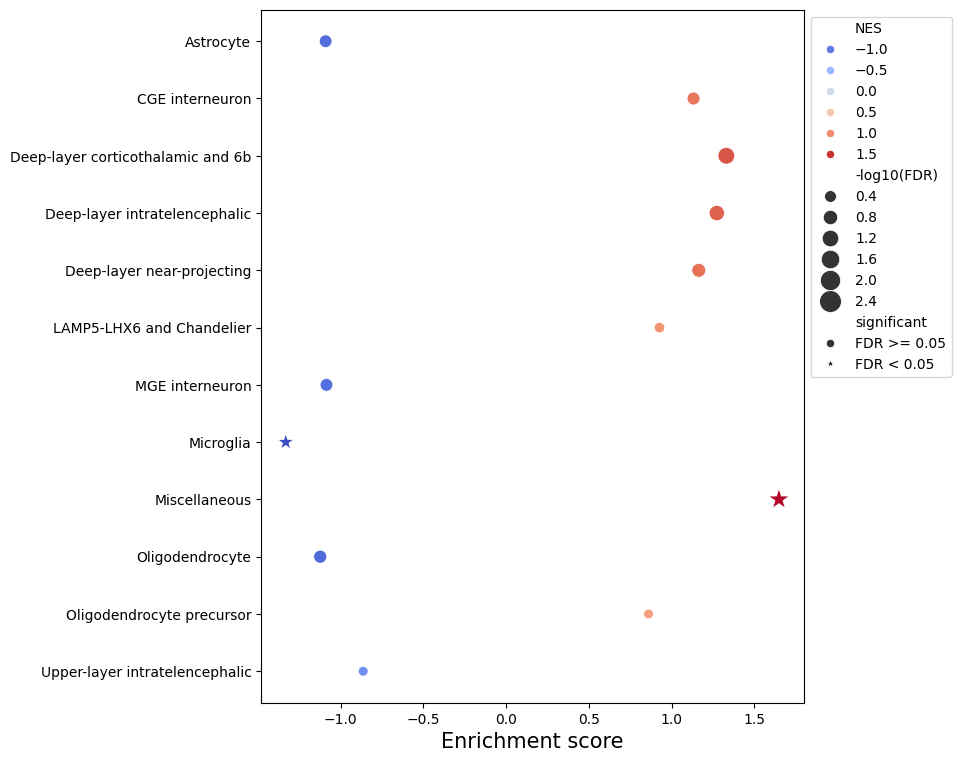

In [23]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='NES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

### Wilcoxon

Specify DE test

In [24]:
key = 'wilcoxon'

Run enrichment for genesets

In [25]:
enrich_df = enrich_celltypes(celltypes, geneset, adata=adata_pb, key=key, gene_col='names', score_col='scores', method='lfc_product', gsea_kw={'verbose': False})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:32:39,768 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:40,882 [WARNING] Duplicated values found in preranked stats: 0.08% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:41,461 [WARNING] Duplicated values found in preranked stats: 0.09% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:42,072 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:42,611 [WARNING] Duplicated values found in preranked stats: 0.09% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:43,655 [WARNING] Duplicated values found in preranked stats: 0.07% of genes
The order of those genes will be

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,human-specific genes,-0.35423,-0.925009,0.617403,0.617403,0.617403,17/63,20.54%,SULF2;IGSF21;PDE1A;SCN3B;GNAI1;ATP1A3;NUAK1;VA...,Astrocyte
0,prerank,human-specific genes,0.32478,0.800053,0.827586,0.827586,0.6,10/63,7.87%,GAD1;ATP1A3;RGS2;CALR;NRXN2;PCP4;EIF1B;MAP1LC3...,CGE interneuron


Process enrichment results

In [26]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,human-specific genes,-0.35423,-0.925009,0.617403,0.617403,0.617403,17/63,20.54%,SULF2;IGSF21;PDE1A;SCN3B;GNAI1;ATP1A3;NUAK1;VA...,Astrocyte,0.208728,depleted,FDR >= 0.05
0,prerank,human-specific genes,0.32478,0.800053,0.827586,0.827586,0.6,10/63,7.87%,GAD1;ATP1A3;RGS2;CALR;NRXN2;PCP4;EIF1B;MAP1LC3...,CGE interneuron,0.081662,enriched,FDR >= 0.05


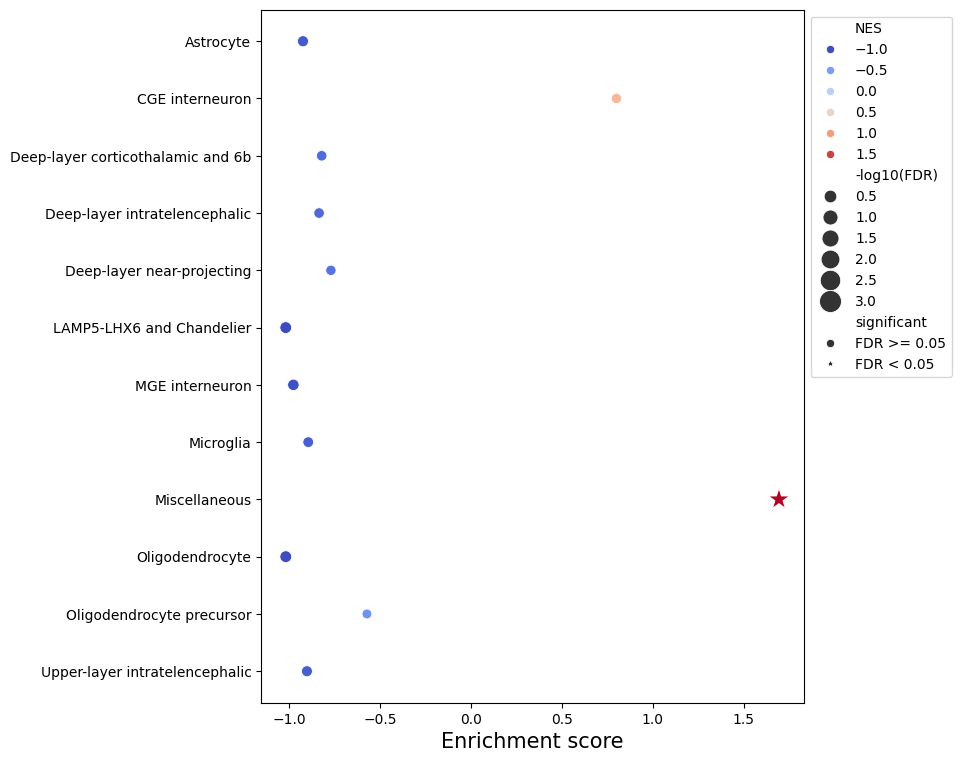

In [27]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='NES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

### Logreg

Specify DE test

In [28]:
key = 'logreg'

Run enrichment for genesets

In [29]:
enrich_df = enrich_celltypes(celltypes, geneset, adata=adata_pb, key=key, gene_col='names', score_col='scores', method='score', gsea_kw={'verbose': False})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:32:46,505 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:47,026 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:47,523 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:47,997 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:48,450 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:48,936 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,human-specific genes,0.395269,1.002443,0.465318,0.465318,0.322,6/63,3.05%,AMZ2;NRXN1;MACF1;ASAP2;ID2;LHX2,Astrocyte
0,prerank,human-specific genes,0.338373,0.879242,0.638066,0.638066,0.409,17/63,14.36%,GAD1;NRXN1;ATP1A3;GNAI1;PCP4;CALR;NRXN2;EIF1B;...,CGE interneuron


Process enrichment results

In [30]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,human-specific genes,0.395269,1.002443,0.465318,0.465318,0.322,6/63,3.05%,AMZ2;NRXN1;MACF1;ASAP2;ID2;LHX2,Astrocyte,0.331318,enriched,FDR >= 0.05
0,prerank,human-specific genes,0.338373,0.879242,0.638066,0.638066,0.409,17/63,14.36%,GAD1;NRXN1;ATP1A3;GNAI1;PCP4;CALR;NRXN2;EIF1B;...,CGE interneuron,0.194455,enriched,FDR >= 0.05


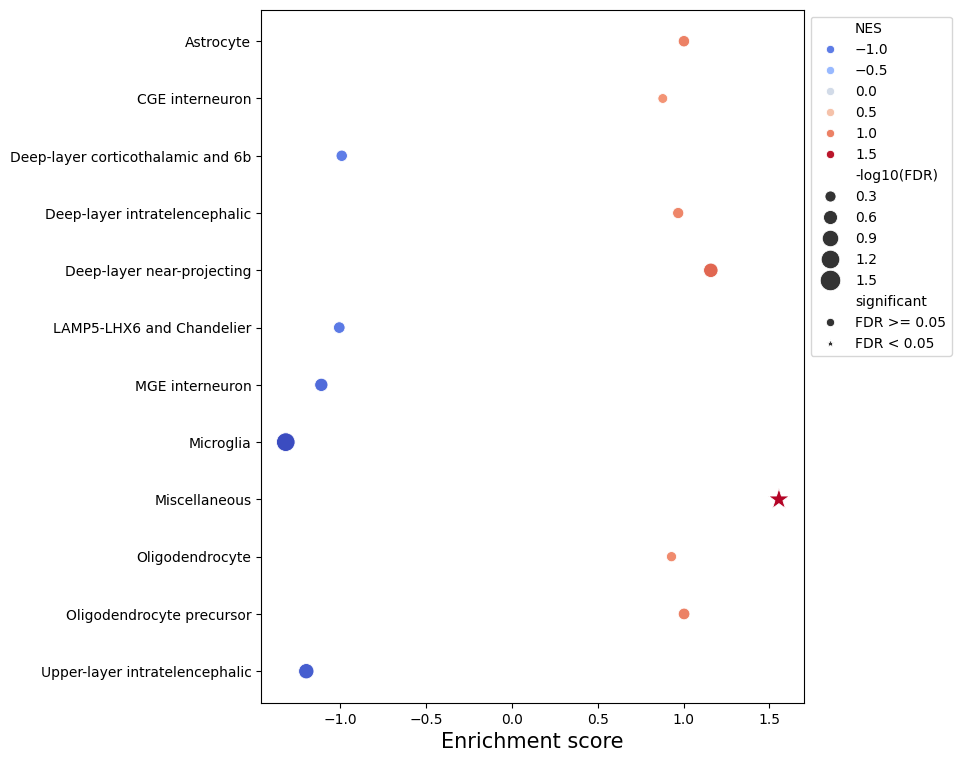

In [31]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='NES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

### EdgeR

Run enrichment for genesets

In [32]:
res_edgeR['Astrocyte']

,names,logFC,logCPM,F,PValue,FDR,score
0,GLUD1,3.397732,7.636025,16431.812032,6.796474e-225,1.049647e-220,16431.812032
1,LRIG1,4.226135,7.298702,9896.307887,4.691220e-206,3.622560e-202,9896.307887
2,ADGRV1,7.183472,8.325861,18209.161644,4.137428e-197,2.129948e-193,18209.161644
3,ATP13A4,5.141511,7.270595,25369.968870,2.149450e-196,8.299026e-193,25369.968870
4,ZNRF3,4.325800,7.677004,12588.022602,1.257685e-194,3.884737e-191,12588.022602
...,...,...,...,...,...,...,...
15439,TMEM184A,-0.046492,6.871514,-0.000013,1.000000e+00,1.000000e+00,0.000000
15440,HTR1A,-0.045256,6.871007,-0.000001,1.000000e+00,1.000000e+00,0.000000
15441,FAM209B,-0.045130,6.871104,-0.000005,1.000000e+00,1.000000e+00,0.000000
15442,DHRS7C,-0.044996,6.871451,-0.000012,1.000000e+00,1.000000e+00,0.000000


In [33]:
enrich_df = enrich_celltypes(res_edgeR, geneset, gene_col='names', score_col='score', method='score', gsea_kw={'verbose': True, 'weight': 0.5})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:32:52,850 [WARNING] Duplicated values found in preranked stats: 2.44% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:52,851 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:32:52,853 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2024-07-30 17:32:52,853 [INFO] 0001 gene_sets used for further statistical testing.....
2024-07-30 17:32:52,854 [INFO] Start to run GSEA...Might take a while..................
2024-07-30 17:32:53,566 [INFO] Congratulations. GSEApy runs successfully................

2024-07-30 17:32:53,583 [WARNING] Duplicated values found in preranked stats: 0.91% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:32:53,584 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:32:53,586 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
20

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,human-specific genes,0.397079,0.963402,0.56,0.56,0.532,8/65,7.68%,AMZ2;MACF1;NRXN1;LHX2;ID2;ASAP2;CHST10;COTL1,Astrocyte
0,prerank,human-specific genes,0.486478,1.362713,0.068616,0.068616,0.061,25/65,19.79%,GAD1;ATP1A3;NRXN2;NRXN1;GNAI1;EIF1B;CALR;MAP1L...,CGE interneuron


Process enrichment results

In [34]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,human-specific genes,0.397079,0.963402,0.56,0.56,0.532,8/65,7.68%,AMZ2;MACF1;NRXN1;LHX2;ID2;ASAP2;CHST10;COTL1,Astrocyte,0.251037,enriched,FDR >= 0.05
0,prerank,human-specific genes,0.486478,1.362713,0.068616,0.068616,0.061,25/65,19.79%,GAD1;ATP1A3;NRXN2;NRXN1;GNAI1;EIF1B;CALR;MAP1L...,CGE interneuron,1.157288,enriched,FDR >= 0.05


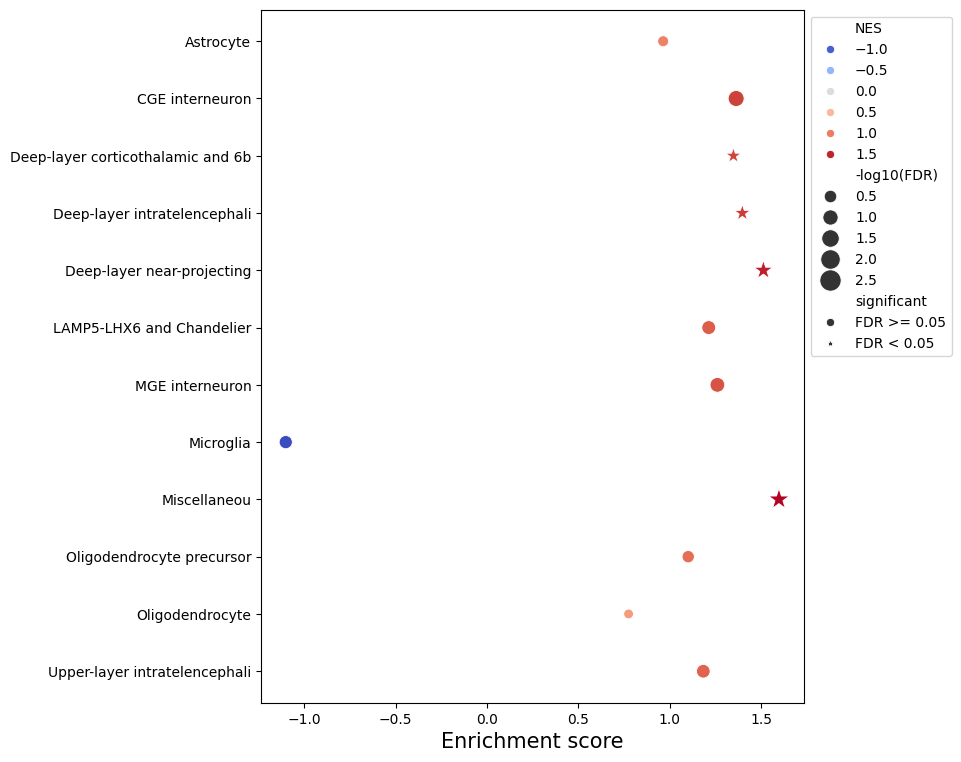

In [35]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)
enrich_norm = mpl.colors.TwoSlopeNorm(vcenter=0)

enrichment_plot(
    enrich_res=enrich_df,
    x='NES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    hue_norm=enrich_norm,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

### EdgeR (logFC)

Run enrichment for genesets

In [36]:
res_edgeR['Astrocyte']

,names,logFC,logCPM,F,PValue,FDR,score
0,GLUD1,3.397732,7.636025,16431.812032,6.796474e-225,1.049647e-220,16431.812032
1,LRIG1,4.226135,7.298702,9896.307887,4.691220e-206,3.622560e-202,9896.307887
2,ADGRV1,7.183472,8.325861,18209.161644,4.137428e-197,2.129948e-193,18209.161644
3,ATP13A4,5.141511,7.270595,25369.968870,2.149450e-196,8.299026e-193,25369.968870
4,ZNRF3,4.325800,7.677004,12588.022602,1.257685e-194,3.884737e-191,12588.022602
...,...,...,...,...,...,...,...
15439,TMEM184A,-0.046492,6.871514,-0.000013,1.000000e+00,1.000000e+00,0.000000
15440,HTR1A,-0.045256,6.871007,-0.000001,1.000000e+00,1.000000e+00,0.000000
15441,FAM209B,-0.045130,6.871104,-0.000005,1.000000e+00,1.000000e+00,0.000000
15442,DHRS7C,-0.044996,6.871451,-0.000012,1.000000e+00,1.000000e+00,0.000000


In [37]:
enrich_df = enrich_celltypes(res_edgeR, geneset, gene_col='names', score_col='logFC', method='score', gsea_kw={'verbose': True, 'weight': 0.5})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:33:01,995 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:33:01,999 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2024-07-30 17:33:02,000 [INFO] 0001 gene_sets used for further statistical testing.....
2024-07-30 17:33:02,001 [INFO] Start to run GSEA...Might take a while..................
2024-07-30 17:33:02,720 [INFO] Congratulations. GSEApy runs successfully................

2024-07-30 17:33:02,730 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:33:02,732 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2024-07-30 17:33:02,733 [INFO] 0001 gene_sets used for further statistical testing.....
2024-07-30 17:33:02,733 [INFO] Start to run GSEA...Might take a while..................
2024-07-30 17:33:03,353 [INFO] Congratulations. GSEApy runs successfully................

2024-07-30 17:33:03,362 [INFO] Parsing data files for GSEA............................

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,human-specific genes,-0.268565,-1.332136,0.08656,0.08656,0.08656,21/65,17.61%,PDE1A;IGSF21;GNAI1;SCN3B;ATP1A3;SULF2;NUAK1;VA...,Astrocyte
0,prerank,human-specific genes,0.323471,1.54013,0.021909,0.021909,0.014,30/65,24.61%,GAD1;ATP1A3;PCP4;NRXN1;GNAI1;NRXN2;EIF1B;MAP1L...,CGE interneuron


Process enrichment results

In [38]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,human-specific genes,-0.268565,-1.332136,0.08656,0.08656,0.08656,21/65,17.61%,PDE1A;IGSF21;GNAI1;SCN3B;ATP1A3;SULF2;NUAK1;VA...,Astrocyte,1.057692,depleted,FDR >= 0.05
0,prerank,human-specific genes,0.323471,1.54013,0.021909,0.021909,0.014,30/65,24.61%,GAD1;ATP1A3;PCP4;NRXN1;GNAI1;NRXN2;EIF1B;MAP1L...,CGE interneuron,1.639989,enriched,FDR < 0.05


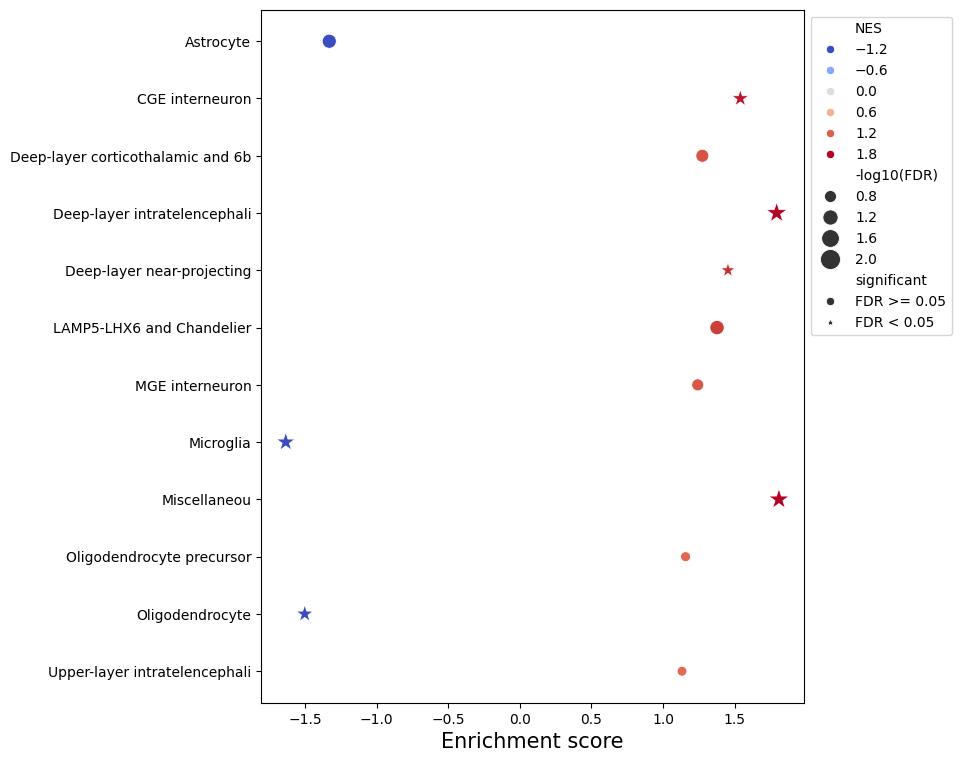

In [39]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='NES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    hue_norm=enrich_norm,
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

### Gene visualization

Calculate average normalized expression

In [40]:
genes = scaled_adata.var_names.intersection(human_specific_genes)
scaled_adata.obs[f'All HS genes'] = scaled_adata[:, genes].X.mean(axis=1)
scaled_adata.obs.head()

,roi,organism_ontology_term_id,disease_ontology_term_id,self_reported_ethnicity_ontology_term_id,assay_ontology_term_id,sex_ontology_term_id,development_stage_ontology_term_id,donor_id,suspension_type,dissection,...,cell_type,assay,disease,organism,sex,tissue,self_reported_ethnicity,development_stage,observation_joinid,All HS genes
CellID,,,,,,,,,,,,,,,,,,,,,
10X227_5:AACGGGATCCGCTGTT,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,oligodendrocyte,10x 3' v3,normal,Homo sapiens,male,cerebral cortex,European,50-year-old human stage,tx#9LwG9SU,-0.012899
10X227_5:ATCATTCAGGCTTAGG,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,oligodendrocyte,10x 3' v3,normal,Homo sapiens,male,cerebral cortex,European,50-year-old human stage,-J@SoycAj;,-0.304054
10X227_5:ACATCCCGTAGGAAAG,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,oligodendrocyte,10x 3' v3,normal,Homo sapiens,male,cerebral cortex,European,50-year-old human stage,0S-cgm|8=>,-0.244717
10X227_5:CCATAAGTCCTGGCTT,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,oligodendrocyte,10x 3' v3,normal,Homo sapiens,male,cerebral cortex,European,50-year-old human stage,%<v9Vj`Hq=,-0.066698
10X227_5:ATTCTTGGTACCAATC,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,oligodendrocyte,10x 3' v3,normal,Homo sapiens,male,cerebral cortex,European,50-year-old human stage,XZZk|?x_a2,-0.243643


Vusualize

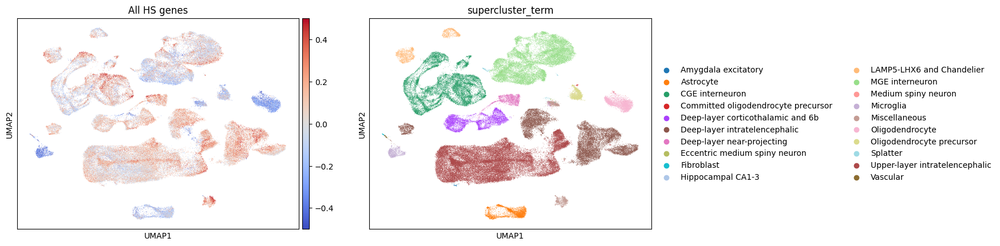

In [41]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmax=0.5, vmin=-0.5)

sc.pl.umap(scaled_adata, color=['All HS genes', 'supercluster_term'], cmap=cmap, norm=norm)

## Enrich for HS/AS groups

Create geneset dict

In [42]:
gene_sets = dict()
for label in hs_groups.label.unique():
  gene_sets[label] = hs_groups[hs_groups.label == label].index.to_list()

### T-test

Specify DE test

In [43]:
key = 't-test'

Run enrichment for genesets

In [44]:
enrich_df = enrich_celltypes(celltypes, gene_sets, adata=adata_pb, key=key, gene_col='names', score_col='scores', method='score', gsea_kw={'verbose': False})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:33:11,675 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:12,282 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:12,952 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:13,544 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:14,745 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:15,396 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,age-specific,-0.406935,-1.148667,0.269815,0.856959,0.530271,7/25,10.72%,GNAI1;ATP1A3;PDE1A;NRXN2;DLGAP4;CX3CL1;CLSTN1,Astrocyte
1,prerank,human-specific,0.424469,0.962712,0.513317,0.50299,0.611,1/9,2.11%,AMZ2,Astrocyte


Process enrichment results

In [45]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,age-specific,-0.406935,-1.148667,0.269815,0.856959,0.530271,7/25,10.72%,GNAI1;ATP1A3;PDE1A;NRXN2;DLGAP4;CX3CL1;CLSTN1,Astrocyte,0.066534,depleted,FDR >= 0.05
1,prerank,human-specific,0.424469,0.962712,0.513317,0.50299,0.611,1/9,2.11%,AMZ2,Astrocyte,0.297578,enriched,FDR >= 0.05


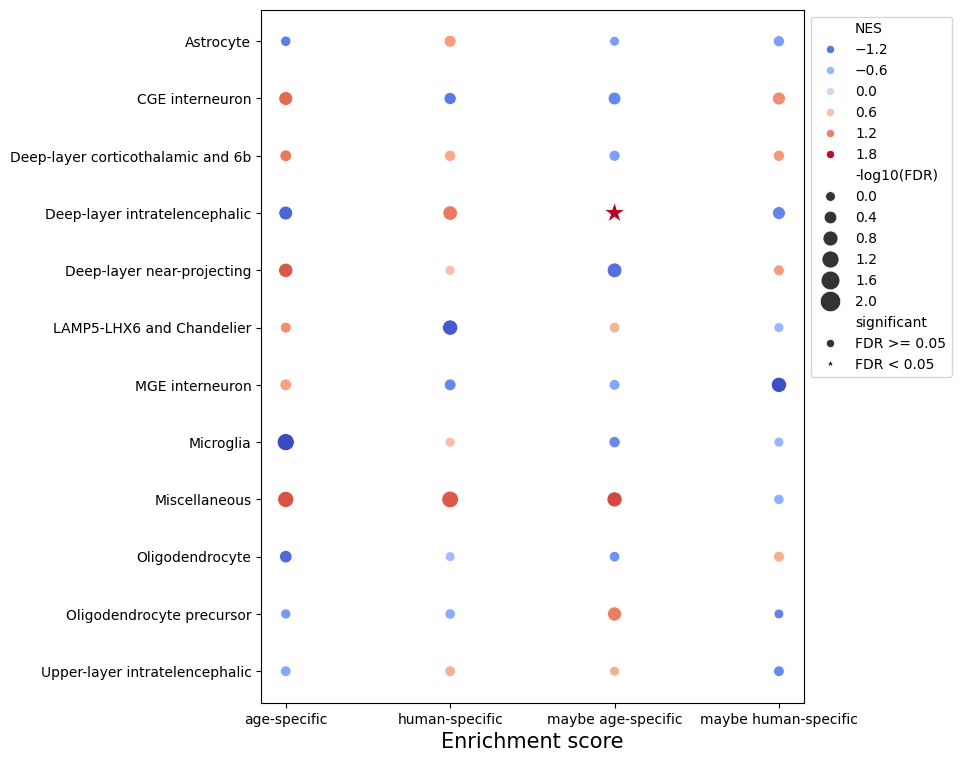

In [46]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='Term',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

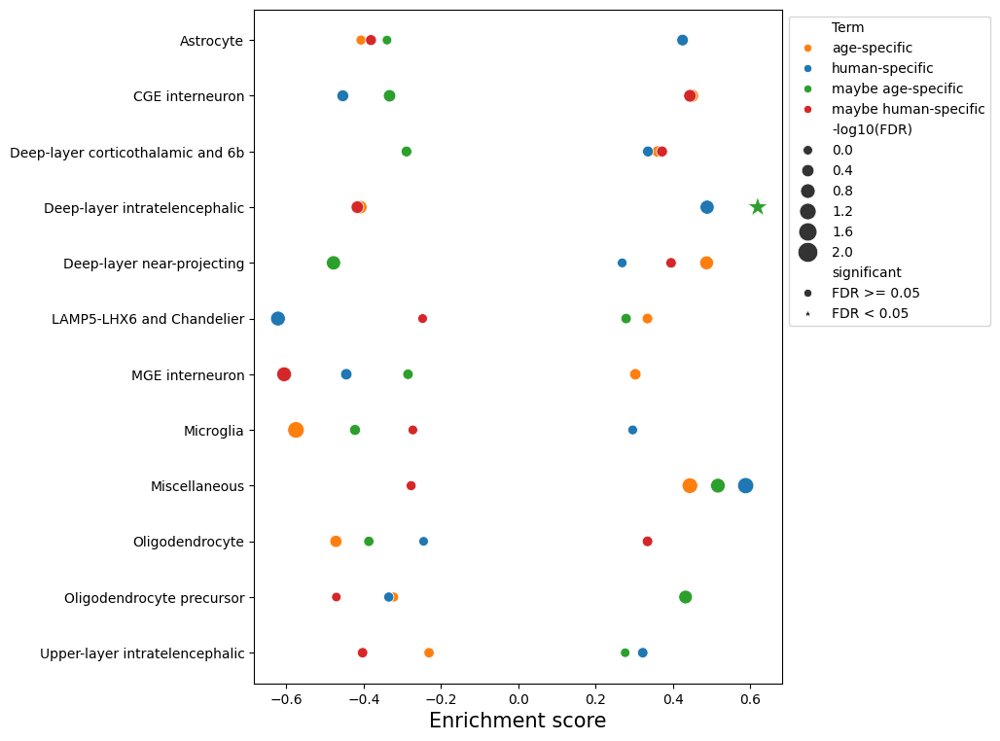

In [47]:
mpl.rcdefaults()
palette = {'human-specific': 'tab:blue', 'age-specific': 'tab:orange', 'maybe human-specific': 'tab:red', 'maybe age-specific': 'tab:green'}

enrichment_plot(
    enrich_res=enrich_df,
    x='ES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='Term',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

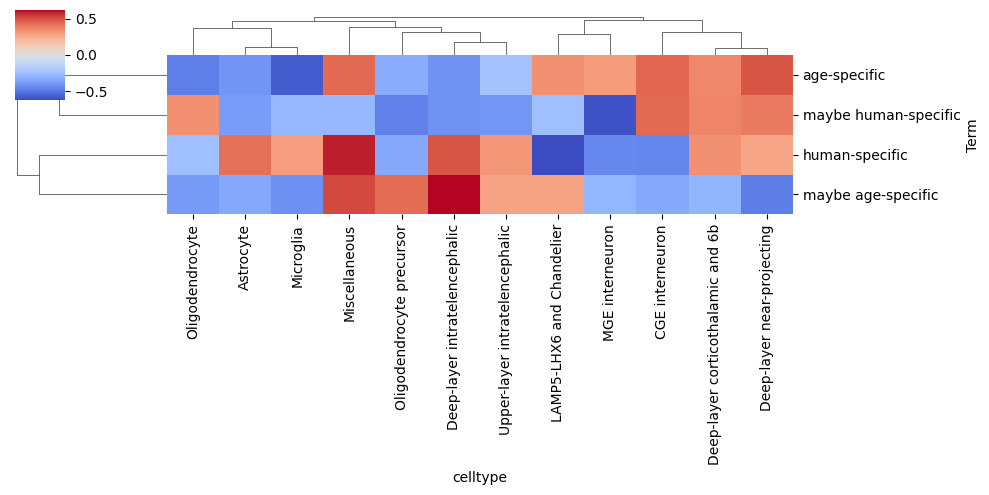

In [48]:
import seaborn as sns
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

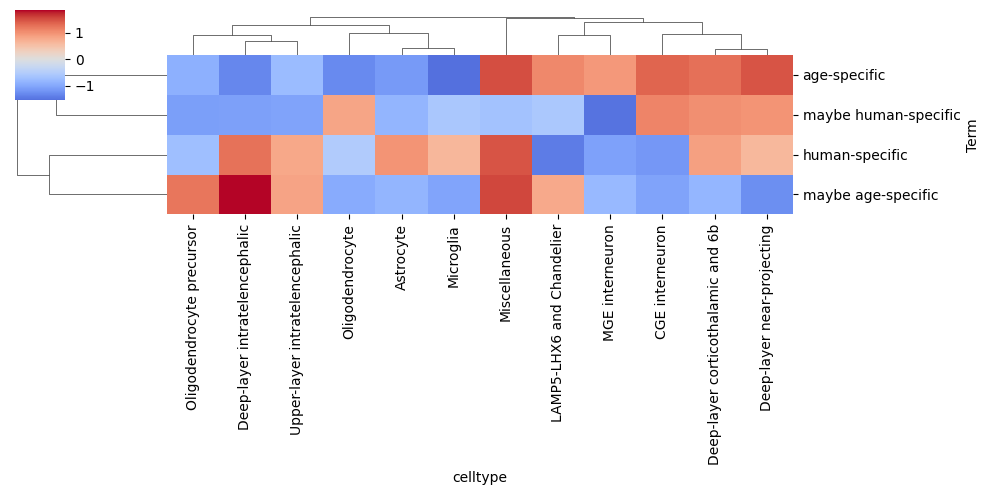

In [49]:
es_df = enrich_df.pivot(index='Term', columns='celltype', values='NES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

<Axes: xlabel='Term', ylabel='celltype'>

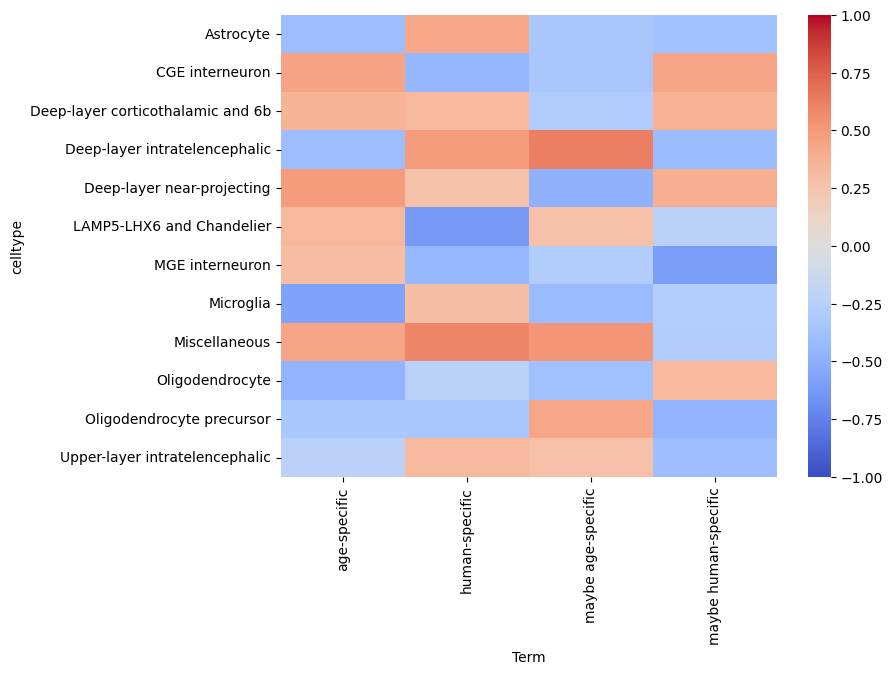

In [50]:
import seaborn as sns
fig = plt.figure(figsize=(8, 6))
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.heatmap(es_df.astype(float).T, cmap='coolwarm', center=0, vmin=-1, vmax=1)

### Wilcoxon

Specify DE test

In [51]:
key = 'wilcoxon'

Run enrichment for genesets

In [52]:
enrich_df = enrich_celltypes(celltypes, gene_sets, adata=adata_pb, key=key, gene_col='names', score_col='scores', method='lfc_product', gsea_kw={'verbose': False})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:33:20,333 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:21,590 [WARNING] Duplicated values found in preranked stats: 0.08% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:22,186 [WARNING] Duplicated values found in preranked stats: 0.09% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:22,785 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:23,341 [WARNING] Duplicated values found in preranked stats: 0.09% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:24,628 [WARNING] Duplicated values found in preranked stats: 0.07% of genes
The order of those genes will be

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,human-specific,0.637692,1.205785,0.260989,0.227304,0.29,1/9,1.26%,AMZ2,Astrocyte
1,prerank,maybe human-specific,-0.528821,-1.005887,0.477021,1.0,0.771574,4/11,20.38%,SCN3B;NUAK1;GDE1;RGS2,Astrocyte


Process enrichment results

In [53]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,human-specific,0.637692,1.205785,0.260989,0.227304,0.29,1/9,1.26%,AMZ2,Astrocyte,0.641486,enriched,FDR >= 0.05
1,prerank,maybe human-specific,-0.528821,-1.005887,0.477021,1.0,0.771574,4/11,20.38%,SCN3B;NUAK1;GDE1;RGS2,Astrocyte,-0.000434,depleted,FDR >= 0.05


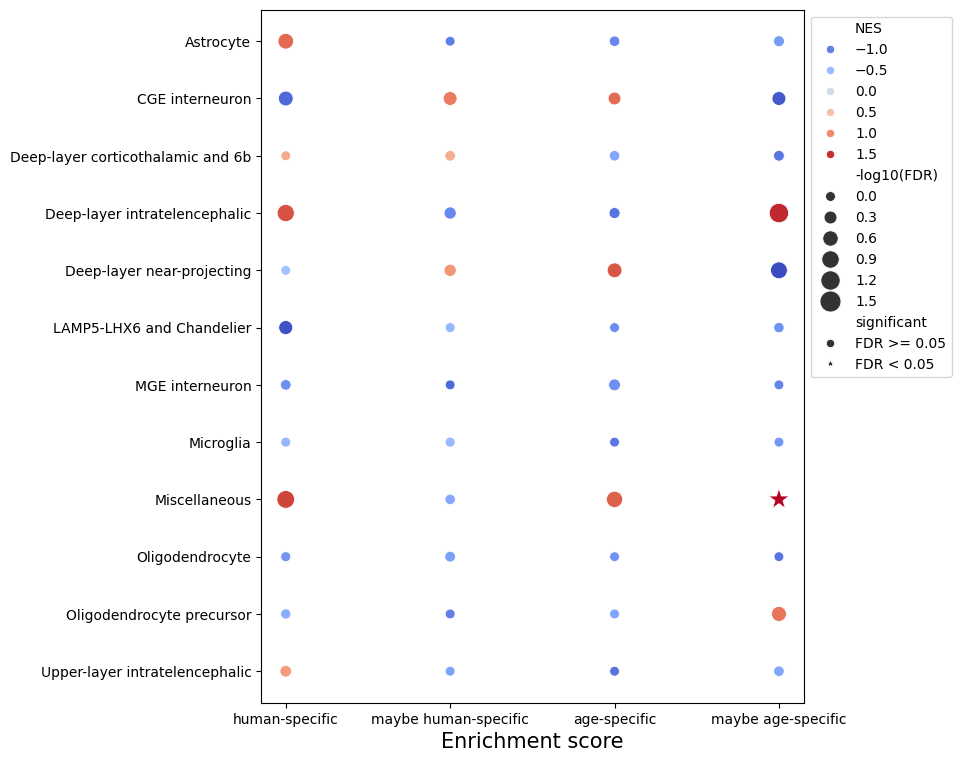

In [54]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='Term',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

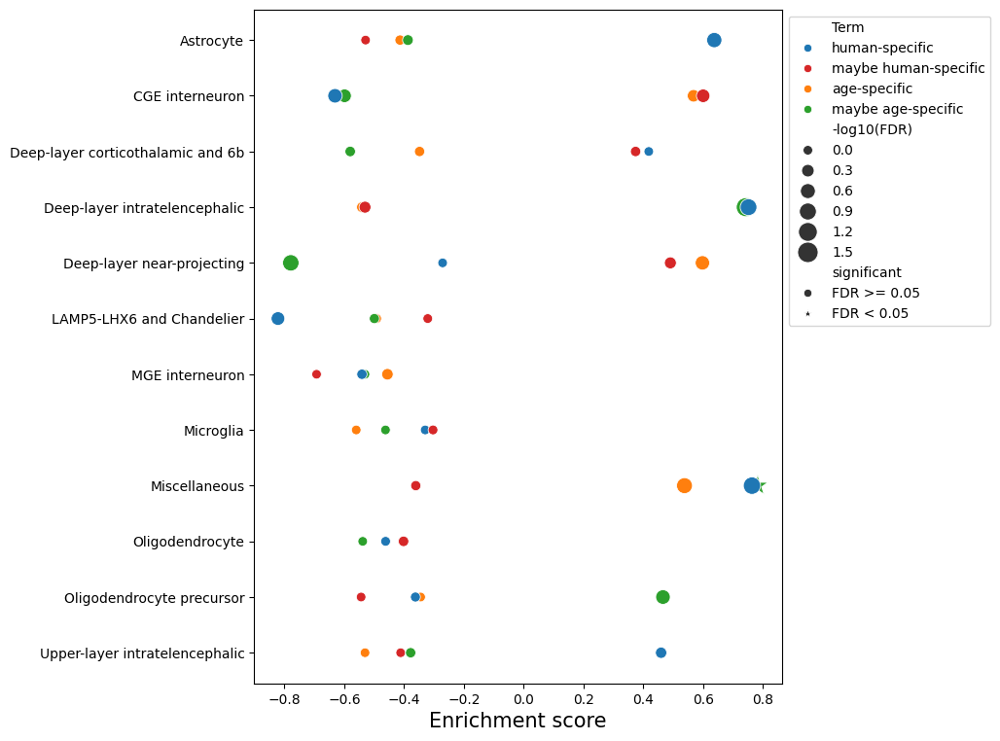

In [55]:
mpl.rcdefaults()
palette = {'human-specific': 'tab:blue', 'age-specific': 'tab:orange', 'maybe human-specific': 'tab:red', 'maybe age-specific': 'tab:green'}

enrichment_plot(
    enrich_res=enrich_df,
    x='ES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='Term',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

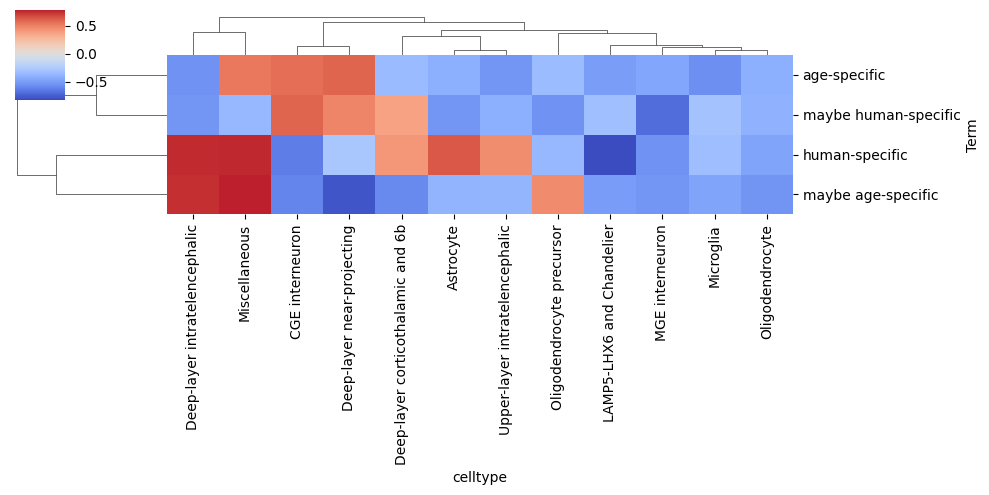

In [56]:
import seaborn as sns
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

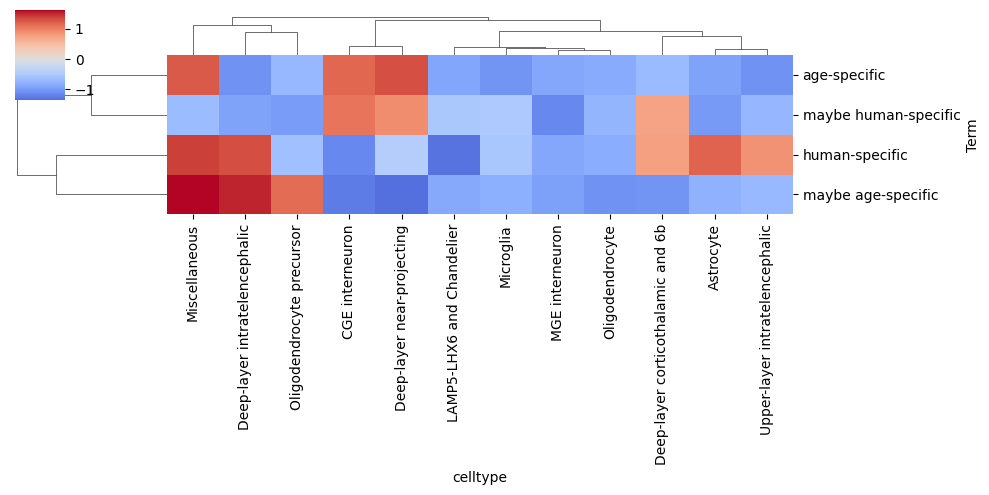

In [57]:
es_df = enrich_df.pivot(index='Term', columns='celltype', values='NES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

<Axes: xlabel='Term', ylabel='celltype'>

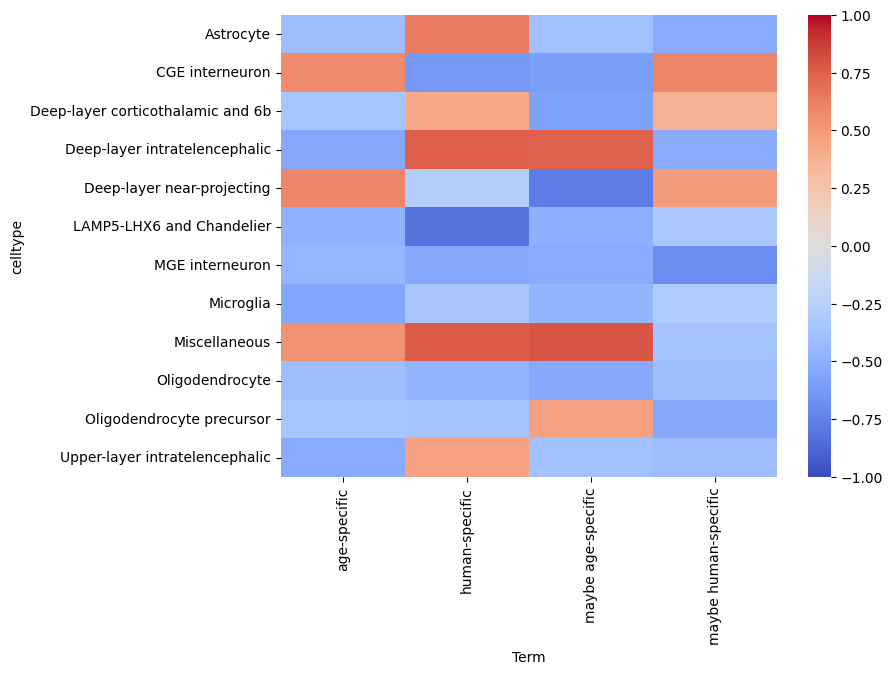

In [58]:
import seaborn as sns
fig = plt.figure(figsize=(8, 6))
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.heatmap(es_df.astype(float).T, cmap='coolwarm', center=0, vmin=-1, vmax=1)

### Logreg

Specify DE test

In [59]:
key = 'logreg'

Run enrichment for genesets

In [60]:
enrich_df = enrich_celltypes(celltypes, gene_sets, adata=adata_pb, key=key, gene_col='names', score_col='scores', method='score', gsea_kw={'verbose': False})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:33:28,854 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:29,433 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:29,979 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:30,539 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:31,146 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:31,701 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,human-specific,0.848449,1.511724,0.026738,0.056301,0.064,1/9,0.33%,AMZ2,Astrocyte
1,prerank,maybe age-specific,0.509385,1.036718,0.407917,0.438718,0.687,3/16,3.05%,MACF1;ID2;LHX2,Astrocyte


Process enrichment results

In [61]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,human-specific,0.848449,1.511724,0.026738,0.056301,0.064,1/9,0.33%,AMZ2,Astrocyte,1.241835,enriched,FDR >= 0.05
1,prerank,maybe age-specific,0.509385,1.036718,0.407917,0.438718,0.687,3/16,3.05%,MACF1;ID2;LHX2,Astrocyte,0.356826,enriched,FDR >= 0.05


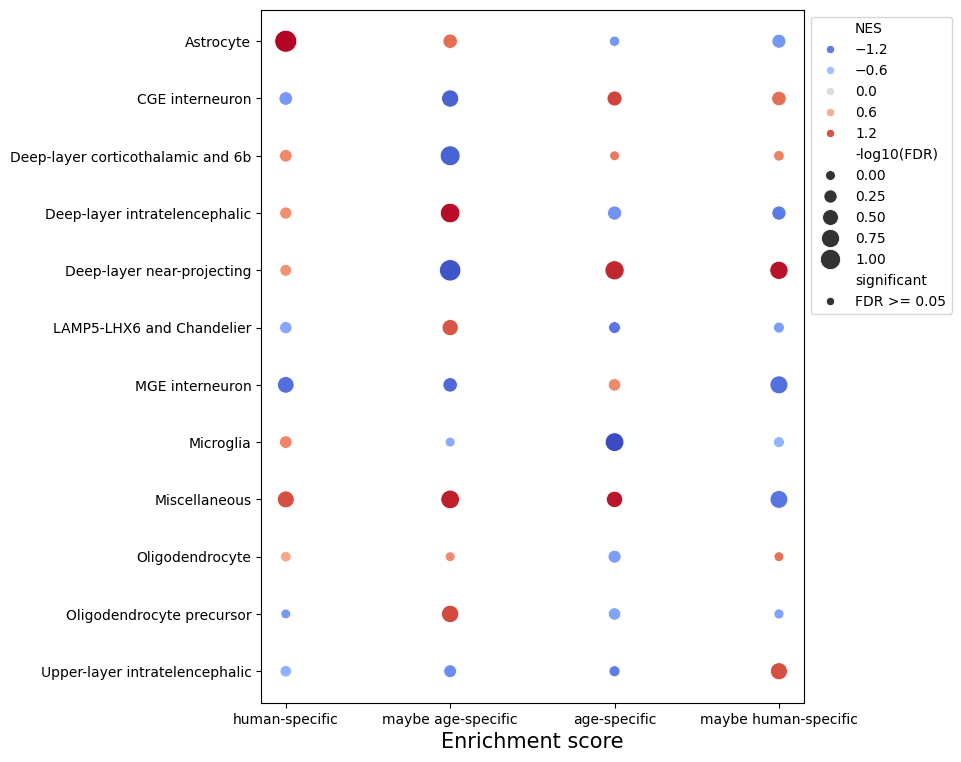

In [62]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='Term',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

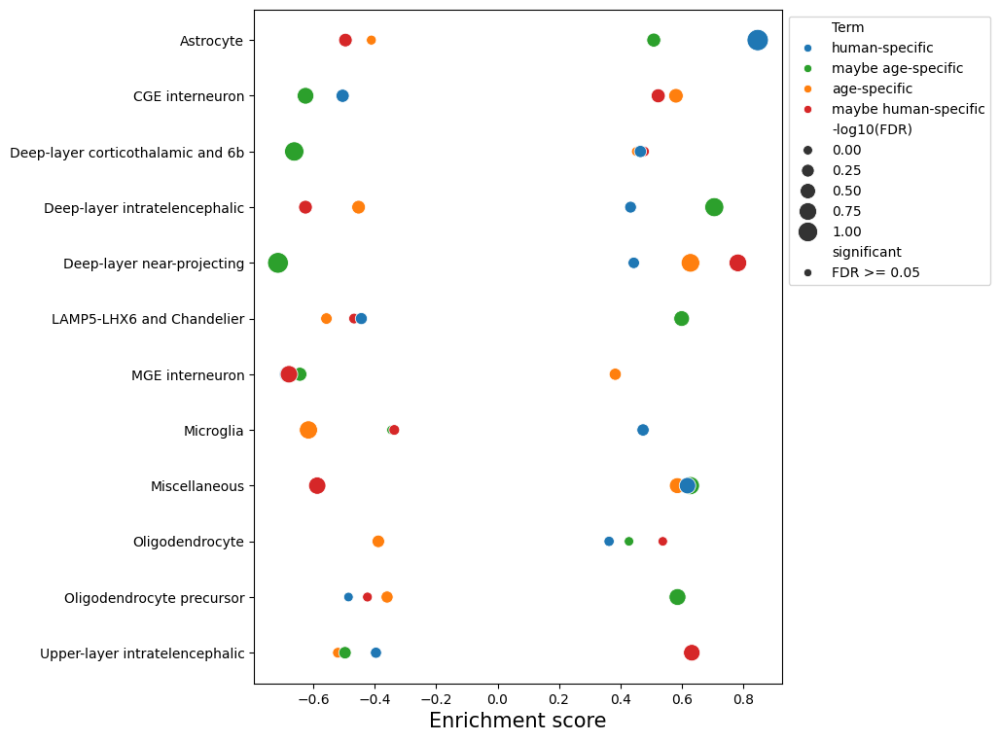

In [63]:
mpl.rcdefaults()
palette = {'human-specific': 'tab:blue', 'age-specific': 'tab:orange', 'maybe human-specific': 'tab:red', 'maybe age-specific': 'tab:green'}

enrichment_plot(
    enrich_res=enrich_df,
    x='ES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='Term',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

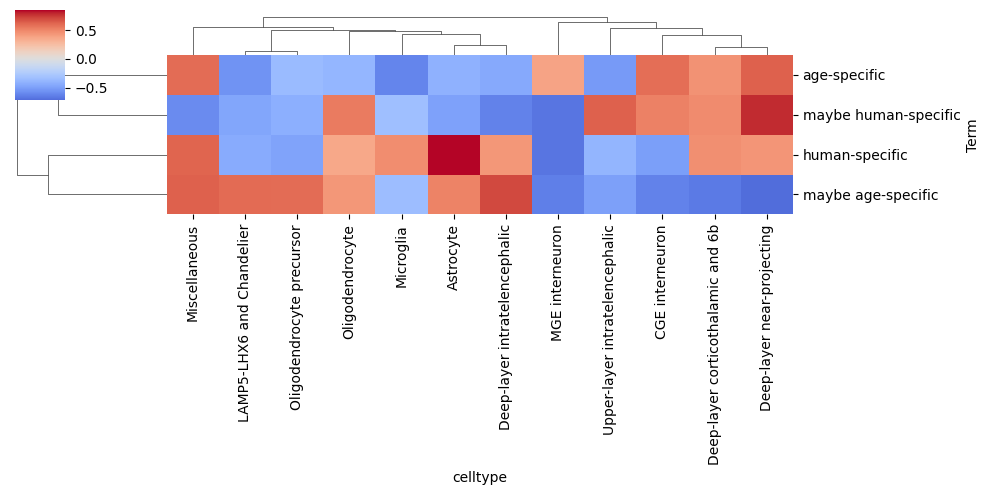

In [64]:
import seaborn as sns
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

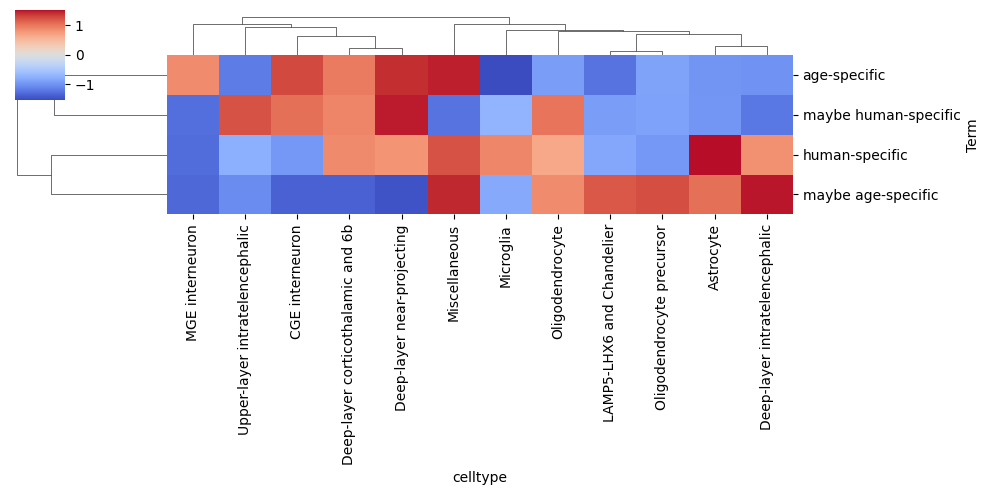

In [65]:
es_df = enrich_df.pivot(index='Term', columns='celltype', values='NES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

<Axes: xlabel='Term', ylabel='celltype'>

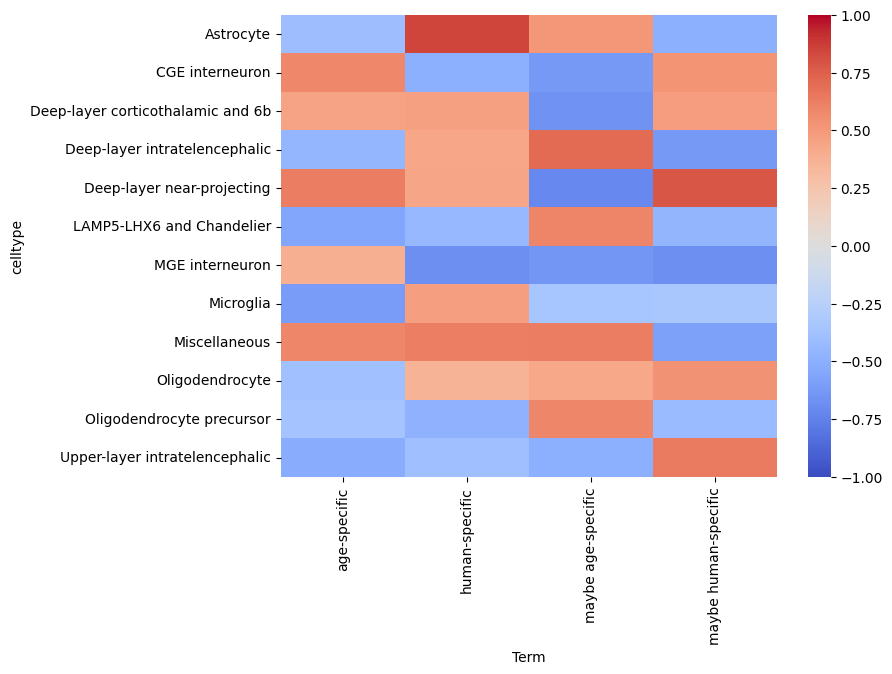

In [66]:
import seaborn as sns
fig = plt.figure(figsize=(8, 6))
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.heatmap(es_df.astype(float).T, cmap='coolwarm', center=0, vmin=-1, vmax=1)

### EdgeR

Run enrichment for genesets

In [67]:
enrich_df = enrich_celltypes(res_edgeR, gene_sets, gene_col='names', score_col='score', method='score', gsea_kw={'verbose': True})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:33:36,778 [WARNING] Duplicated values found in preranked stats: 2.44% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:36,779 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:33:36,781 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2024-07-30 17:33:36,782 [INFO] 0004 gene_sets used for further statistical testing.....
2024-07-30 17:33:36,783 [INFO] Start to run GSEA...Might take a while..................
2024-07-30 17:33:37,664 [INFO] Congratulations. GSEApy runs successfully................

2024-07-30 17:33:37,676 [WARNING] Duplicated values found in preranked stats: 0.91% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:33:37,677 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:33:37,679 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
20

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,human-specific,0.982073,1.375668,0.008208,0.017402,0.014,1/9,0.27%,AMZ2,Astrocyte
1,prerank,maybe age-specific,0.840288,1.187512,0.243667,0.503418,0.576,3/16,4.68%,MACF1;LHX2;ID2,Astrocyte


Process enrichment results

In [68]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,human-specific,0.982073,1.375668,0.008208,0.017402,0.014,1/9,0.27%,AMZ2,Astrocyte,1.735132,enriched,FDR < 0.05
1,prerank,maybe age-specific,0.840288,1.187512,0.243667,0.503418,0.576,3/16,4.68%,MACF1;LHX2;ID2,Astrocyte,0.297209,enriched,FDR >= 0.05


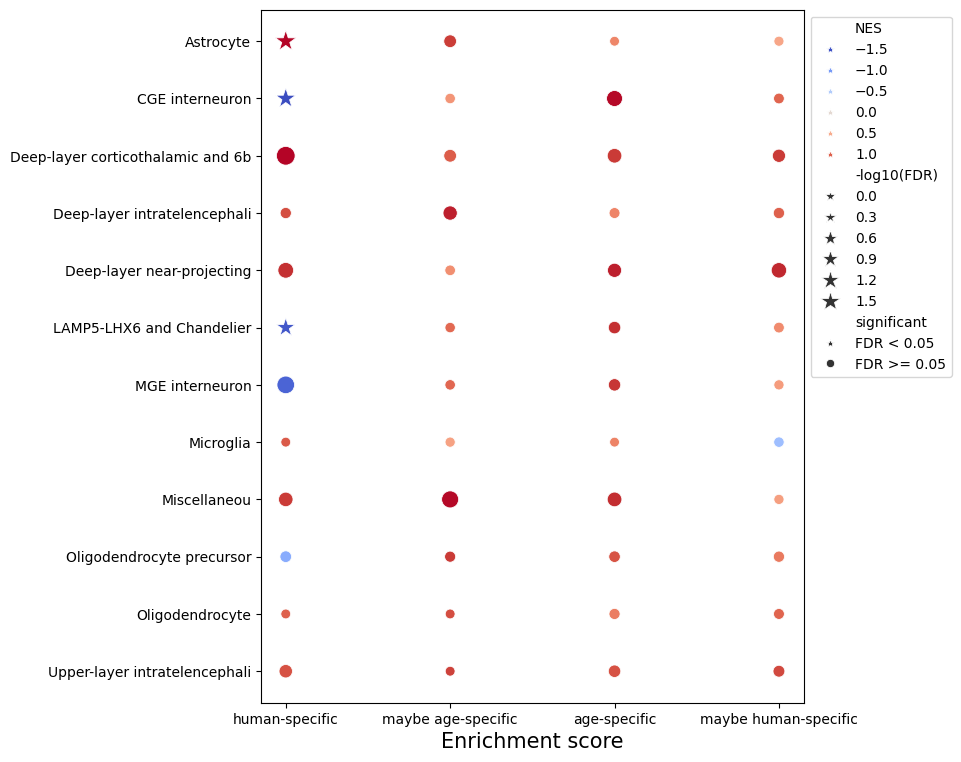

In [69]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='Term',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

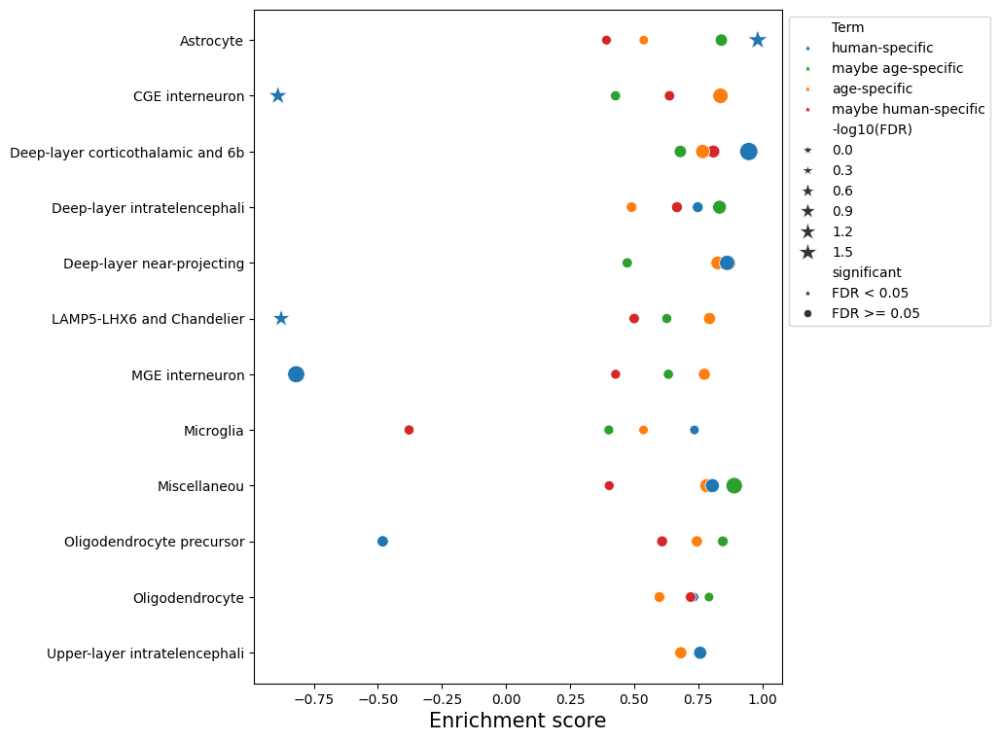

In [70]:
mpl.rcdefaults()
palette = {'human-specific': 'tab:blue', 'age-specific': 'tab:orange', 'maybe human-specific': 'tab:red', 'maybe age-specific': 'tab:green'}

enrichment_plot(
    enrich_res=enrich_df,
    x='ES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='Term',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

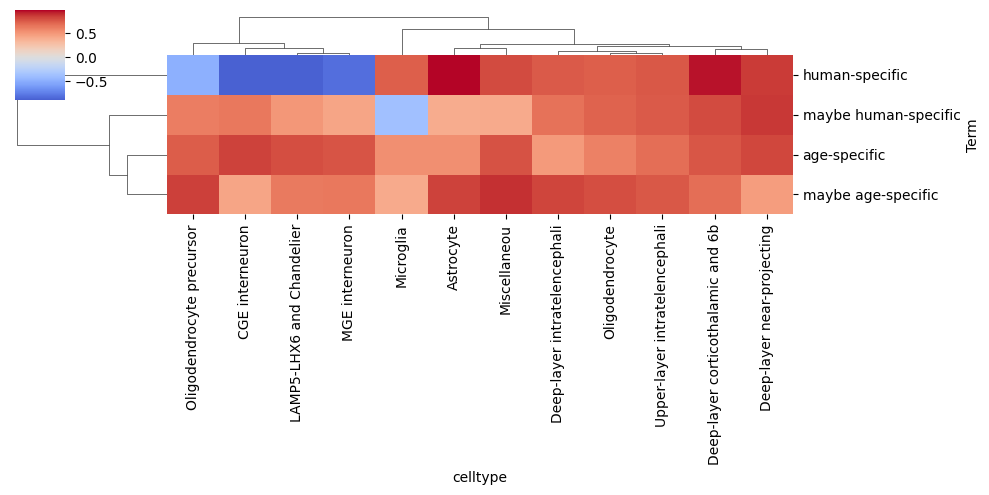

In [71]:
import seaborn as sns
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

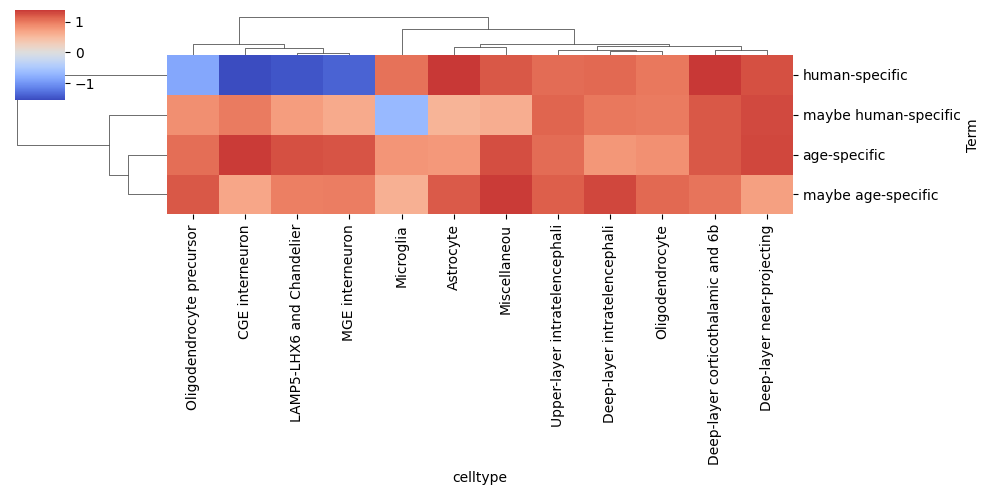

In [72]:
es_df = enrich_df.pivot(index='Term', columns='celltype', values='NES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

<Axes: xlabel='Term', ylabel='celltype'>

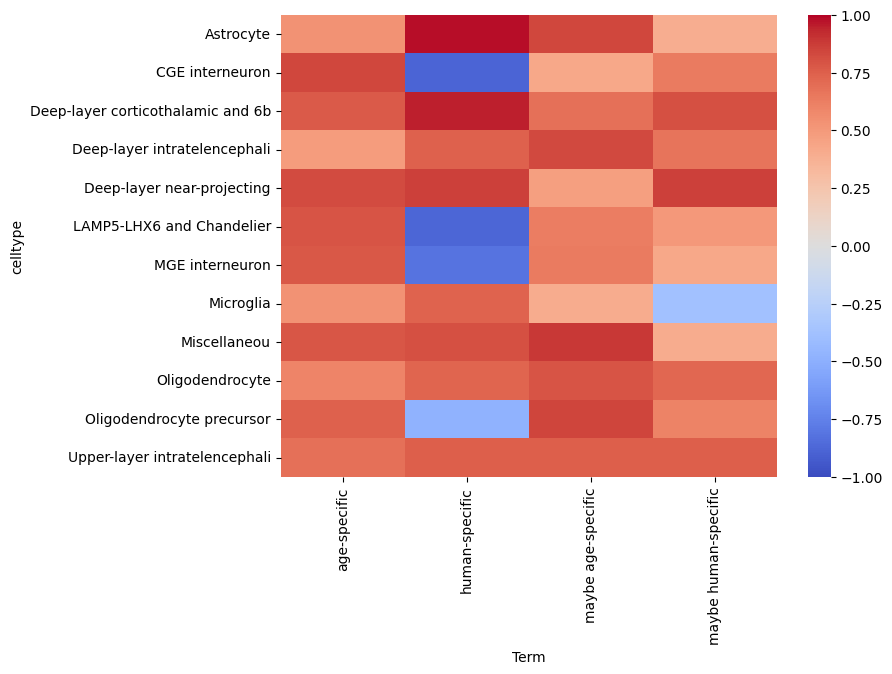

In [73]:
import seaborn as sns
fig = plt.figure(figsize=(8, 6))
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.heatmap(es_df.astype(float).T, cmap='coolwarm', center=0, vmin=-1, vmax=1)

### EdgeR (logFC)

Run enrichment for genesets

In [74]:
enrich_df = enrich_celltypes(res_edgeR, gene_sets, gene_col='names', score_col='logFC', method='score', gsea_kw={'verbose': True, 'weight': 0.5})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:33:46,722 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:33:46,724 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2024-07-30 17:33:46,725 [INFO] 0004 gene_sets used for further statistical testing.....
2024-07-30 17:33:46,725 [INFO] Start to run GSEA...Might take a while..................
2024-07-30 17:33:47,428 [INFO] Congratulations. GSEApy runs successfully................

2024-07-30 17:33:47,436 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:33:47,440 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2024-07-30 17:33:47,442 [INFO] 0004 gene_sets used for further statistical testing.....
2024-07-30 17:33:47,442 [INFO] Start to run GSEA...Might take a while..................
2024-07-30 17:33:48,163 [INFO] Congratulations. GSEApy runs successfully................

2024-07-30 17:33:48,176 [INFO] Parsing data files for GSEA............................

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,age-specific,-0.383611,-1.513402,0.039501,0.159918,0.11016,11/26,17.51%,PDE1A;GNAI1;ATP1A3;NRXN2;GAD1;DLGAP4;CX3CL1;CL...,Astrocyte
1,prerank,maybe age-specific,-0.294853,-0.988625,0.476395,0.711174,0.699465,7/16,19.77%,IGSF21;SULF2;VAT1L;EIF1B;CAMLG;EIF3L;GPX4,Astrocyte


Process enrichment results

In [75]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,age-specific,-0.383611,-1.513402,0.039501,0.159918,0.11016,11/26,17.51%,PDE1A;GNAI1;ATP1A3;NRXN2;GAD1;DLGAP4;CX3CL1;CL...,Astrocyte,0.793395,depleted,FDR >= 0.05
1,prerank,maybe age-specific,-0.294853,-0.988625,0.476395,0.711174,0.699465,7/16,19.77%,IGSF21;SULF2;VAT1L;EIF1B;CAMLG;EIF3L;GPX4,Astrocyte,0.147414,depleted,FDR >= 0.05


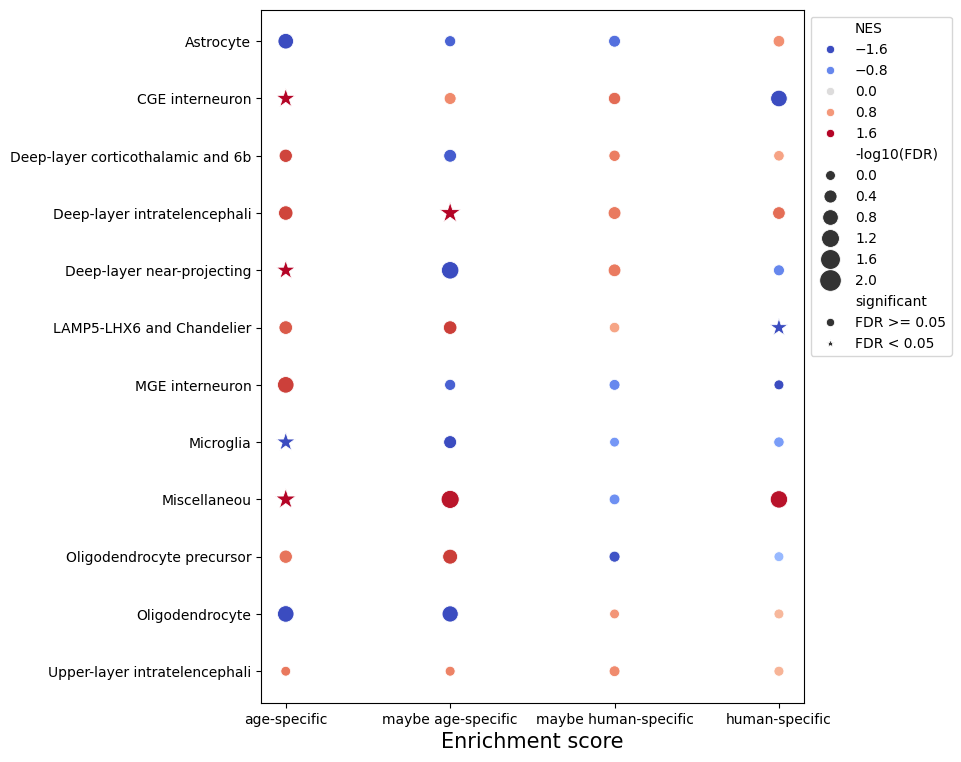

In [76]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='Term',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    hue_norm=enrich_norm,
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

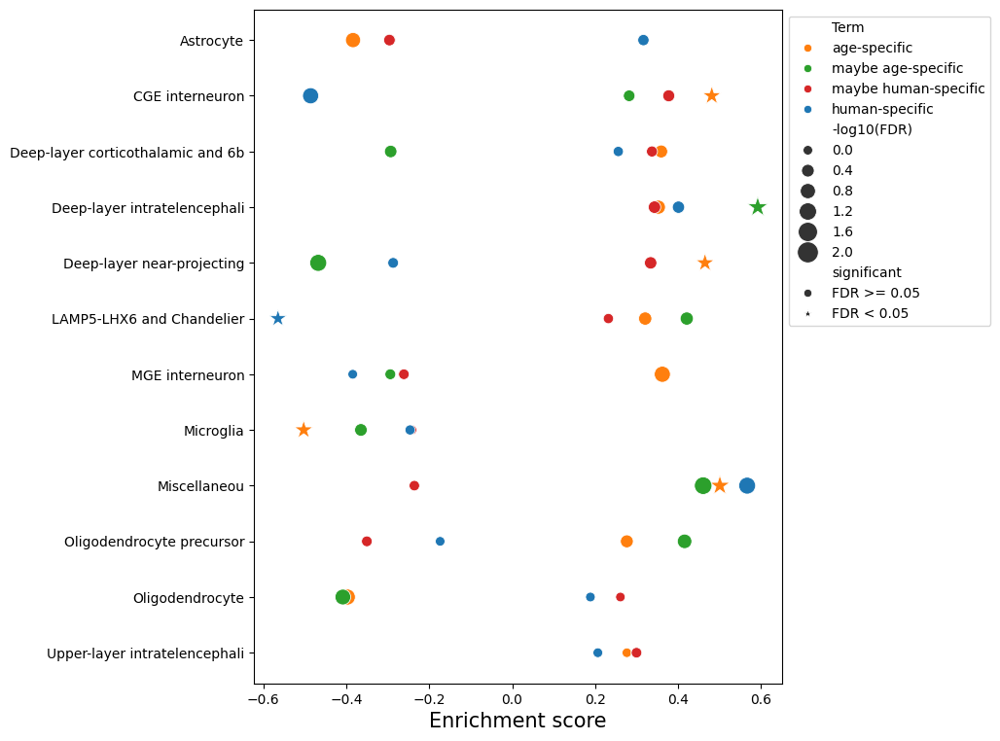

In [77]:
mpl.rcdefaults()
palette = {'human-specific': 'tab:blue', 'age-specific': 'tab:orange', 'maybe human-specific': 'tab:red', 'maybe age-specific': 'tab:green'}

enrichment_plot(
    enrich_res=enrich_df,
    x='ES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='Term',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

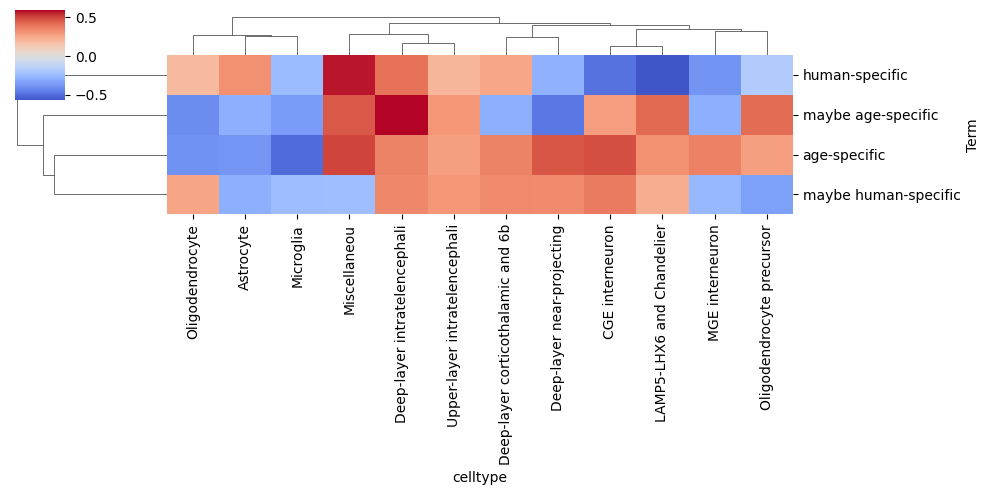

In [78]:
import seaborn as sns
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

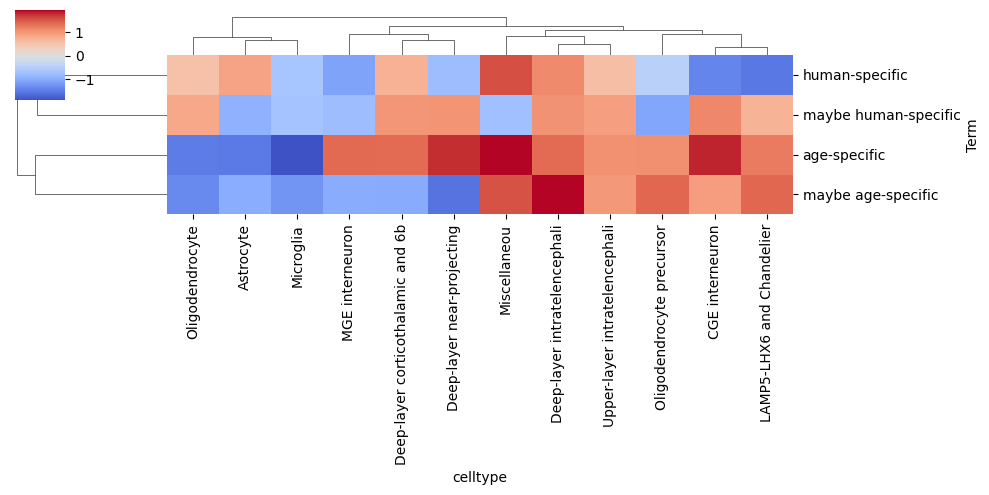

In [79]:
es_df = enrich_df.pivot(index='Term', columns='celltype', values='NES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

<Axes: xlabel='Term', ylabel='celltype'>

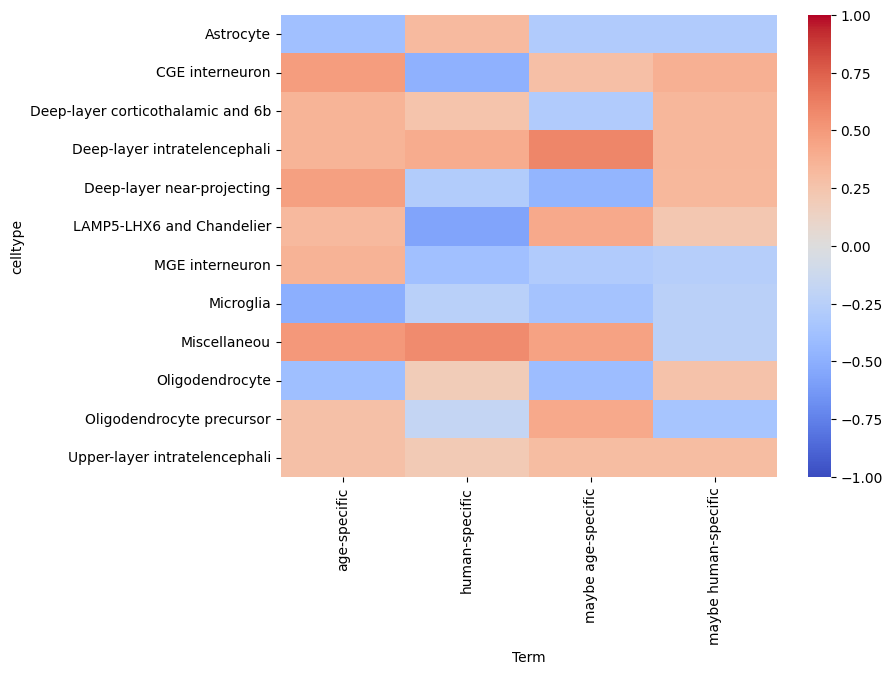

In [80]:
import seaborn as sns
fig = plt.figure(figsize=(8, 6))
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.heatmap(es_df.astype(float).T, cmap='coolwarm', center=0, vmin=-1, vmax=1)

### Gene visualization

Calculate average normalized expression

In [81]:
for supercluster_term in gene_sets.keys():
    genes = scaled_adata.var_names.intersection(gene_sets[supercluster_term])
    scaled_adata.obs[f'{supercluster_term}_scaled'] = scaled_adata[:, genes].X.mean(axis=1)
scaled_adata.obs.head()

,roi,organism_ontology_term_id,disease_ontology_term_id,self_reported_ethnicity_ontology_term_id,assay_ontology_term_id,sex_ontology_term_id,development_stage_ontology_term_id,donor_id,suspension_type,dissection,...,sex,tissue,self_reported_ethnicity,development_stage,observation_joinid,All HS genes,age-specific_scaled,maybe age-specific_scaled,maybe human-specific_scaled,human-specific_scaled
CellID,,,,,,,,,,,,,,,,,,,,,
10X227_5:AACGGGATCCGCTGTT,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,male,cerebral cortex,European,50-year-old human stage,tx#9LwG9SU,-0.012899,0.130140,-0.112366,0.179321,-0.320138
10X227_5:ATCATTCAGGCTTAGG,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,male,cerebral cortex,European,50-year-old human stage,-J@SoycAj;,-0.304054,-0.459783,0.013721,-0.552547,0.032969
10X227_5:ACATCCCGTAGGAAAG,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,male,cerebral cortex,European,50-year-old human stage,0S-cgm|8=>,-0.244717,-0.420267,-0.172398,-0.198002,0.205507
10X227_5:CCATAAGTCCTGGCTT,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,male,cerebral cortex,European,50-year-old human stage,%<v9Vj`Hq=,-0.066698,-0.366426,-0.311726,0.332564,0.632647
10X227_5:ATTCTTGGTACCAATC,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,male,cerebral cortex,European,50-year-old human stage,XZZk|?x_a2,-0.243643,-0.216217,-0.171606,-0.290054,-0.254880


Vusualize

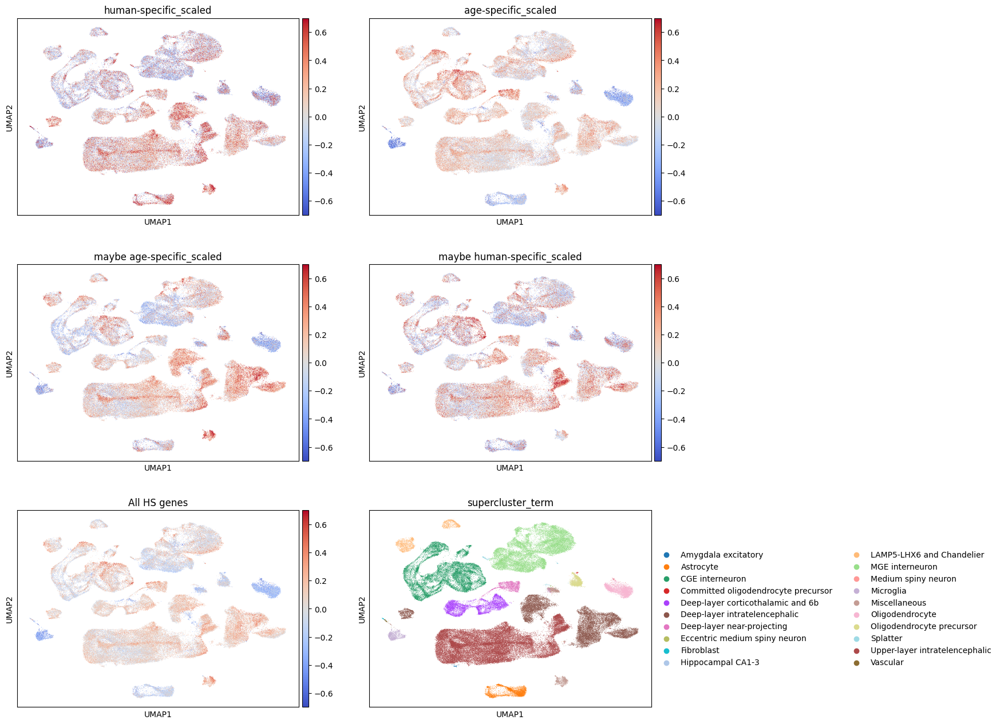

In [82]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmax=0.7, vmin=-0.7)
color = [
    'human-specific_scaled', 
    'age-specific_scaled', 
    'maybe age-specific_scaled', 
    'maybe human-specific_scaled', 
    'All HS genes', 
    'supercluster_term'
    ]

sc.pl.umap(scaled_adata, color=color, cmap=cmap, norm=norm, ncols=2)

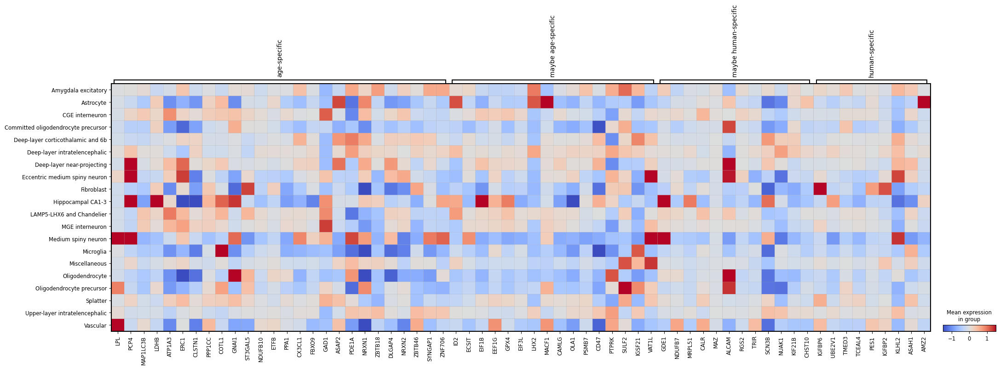

In [83]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmax=1.5, vmin=-1.5)
gene_sets_inter = {key: scaled_adata.var_names.intersection(value) for key, value in gene_sets.items()}

sc.pl.matrixplot(scaled_adata, gene_sets_inter, groupby='supercluster_term', cmap='coolwarm', norm=norm)

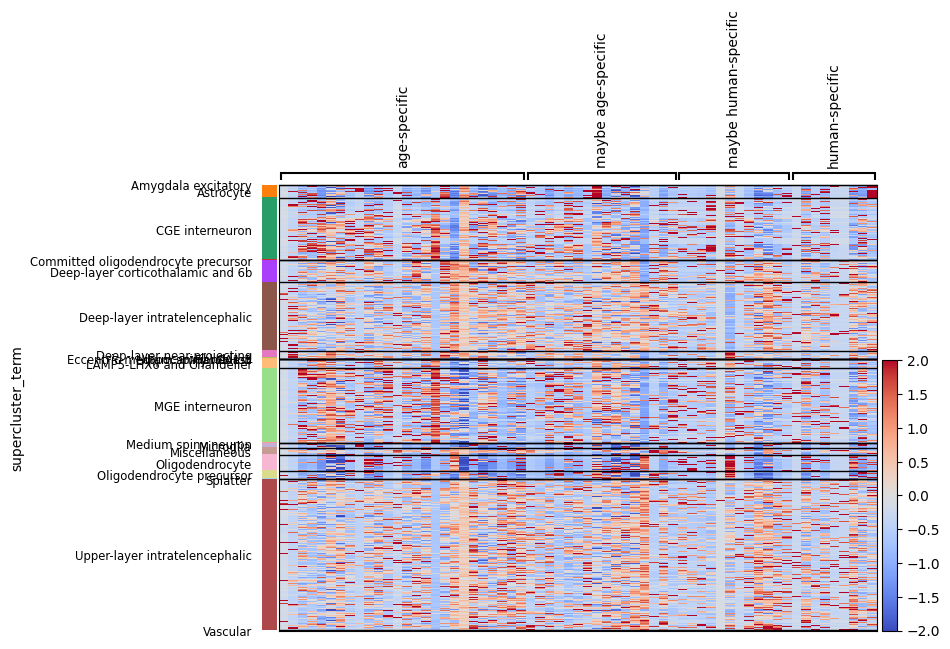

In [84]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmax=2, vmin=-2)
gene_sets_inter = {key: scaled_adata.var_names.intersection(value) for key, value in gene_sets.items()}

sc.pl.heatmap(scaled_adata, gene_sets_inter, groupby='supercluster_term', cmap='coolwarm', norm=norm)

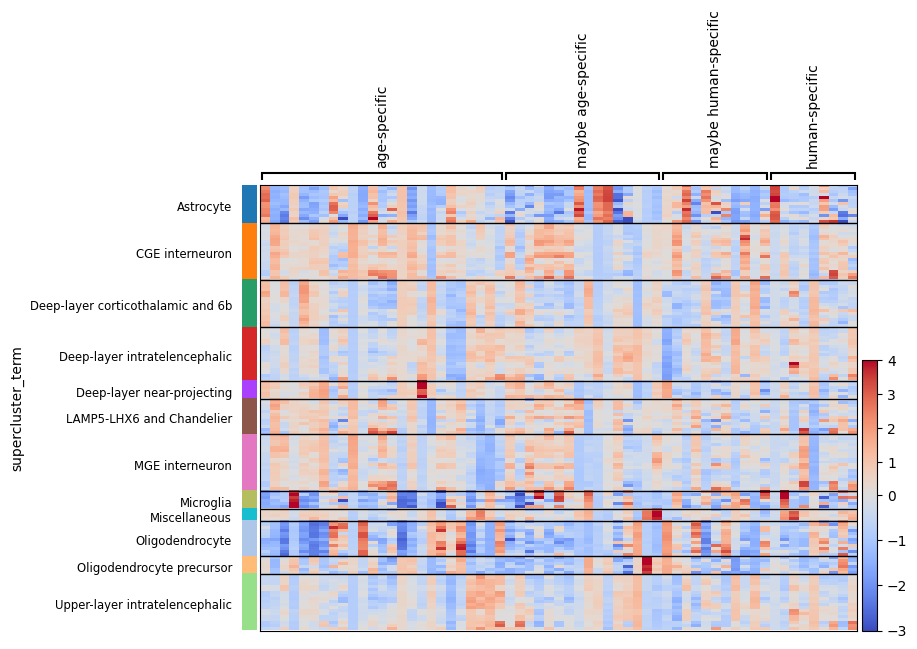

In [85]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0)
gene_sets_inter = {key: scaled_adata_pb.var_names.intersection(value) for key, value in gene_sets.items()}

sc.pl.heatmap(scaled_adata_pb, gene_sets_inter, groupby='supercluster_term', cmap='coolwarm', vcenter=0, vmin=-3, vmax=4)

## Enrich for clusters

In [86]:
gene_sets = dict()
for label in cluster_groups.label.unique():
  gene_sets[f'cluster{label}'] = cluster_groups[cluster_groups.label == label].index.to_list()

### T-test

Specify DE test

In [87]:
key = 't-test'

Run enrichment for genesets

In [88]:
enrich_df = enrich_celltypes(celltypes, gene_sets, adata=adata_pb, key=key, gene_col='names', score_col='scores', method='score', gsea_kw={'verbose': False})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:34:01,627 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:02,265 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:02,895 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:03,582 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:05,029 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:05,667 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,cluster2,-0.759919,-1.52957,0.019713,0.073883,0.08325,4/7,9.12%,GNAI1;NUAK1;CX3CL1;OLA1,Astrocyte
1,prerank,cluster4,-0.697147,-1.457781,0.041806,0.075172,0.164493,4/8,10.72%,ATP1A3;IGSF21;VAT1L;CLSTN1,Astrocyte


Process enrichment results

In [89]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,cluster2,-0.759919,-1.52957,0.019713,0.073883,0.08325,4/7,9.12%,GNAI1;NUAK1;CX3CL1;OLA1,Astrocyte,1.125616,depleted,FDR >= 0.05
1,prerank,cluster4,-0.697147,-1.457781,0.041806,0.075172,0.164493,4/8,10.72%,ATP1A3;IGSF21;VAT1L;CLSTN1,Astrocyte,1.118206,depleted,FDR >= 0.05


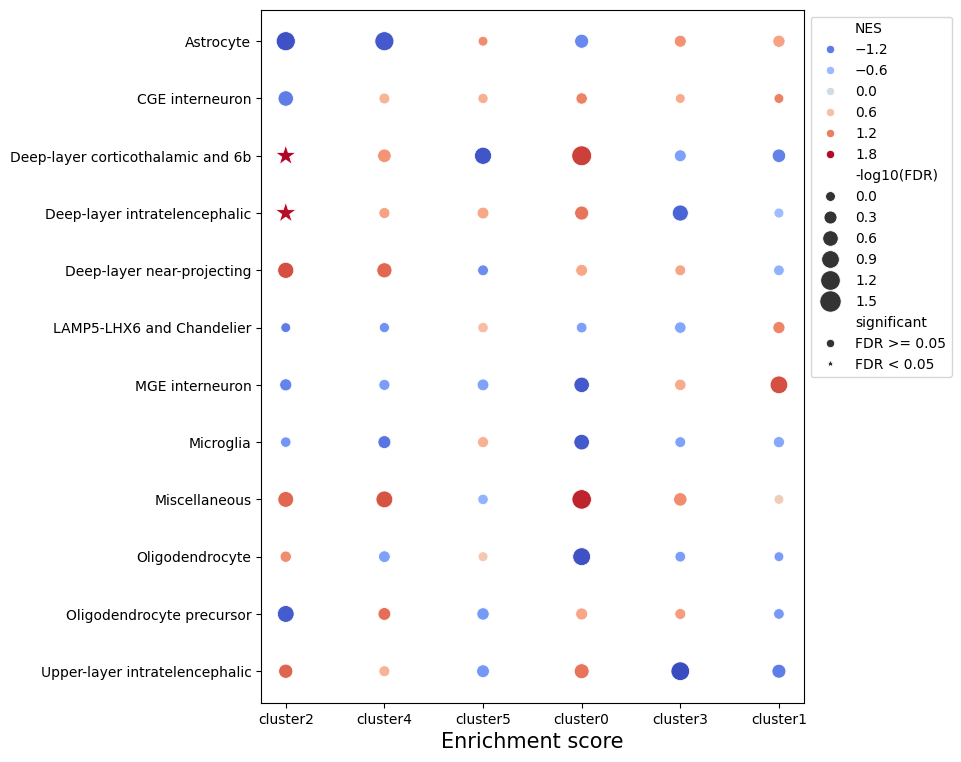

In [90]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='Term',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

C:\Users\claptar\AppData\Local\Temp\ipykernel_17936\2110194606.py:6: UserWarning: The palette list has more values (12) than needed (6), which may not be intended.
  ax = sns.scatterplot(data=enrich_res.reset_index(), **kw_scatterplot)


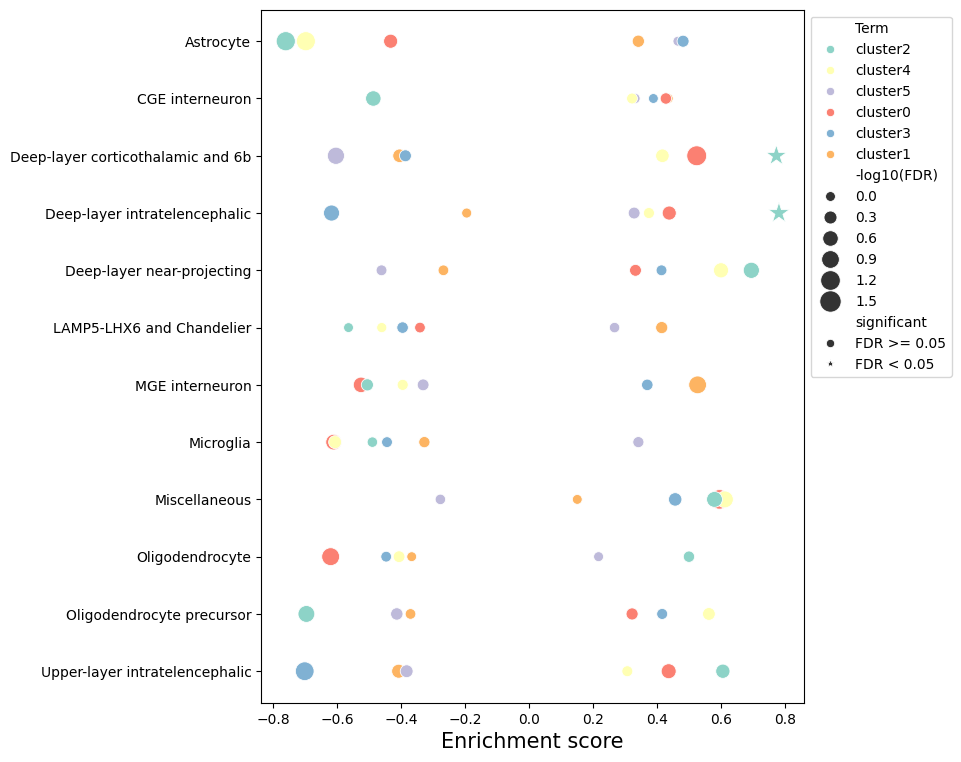

In [91]:
mpl.rcdefaults()
palette = sns.color_palette("Set3")

enrichment_plot(
    enrich_res=enrich_df,
    x='ES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='Term',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

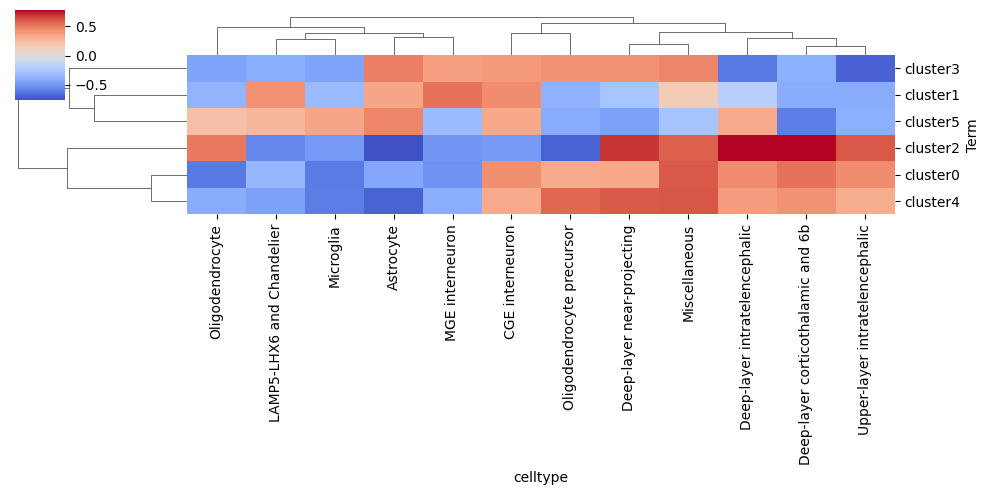

In [92]:
import seaborn as sns
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

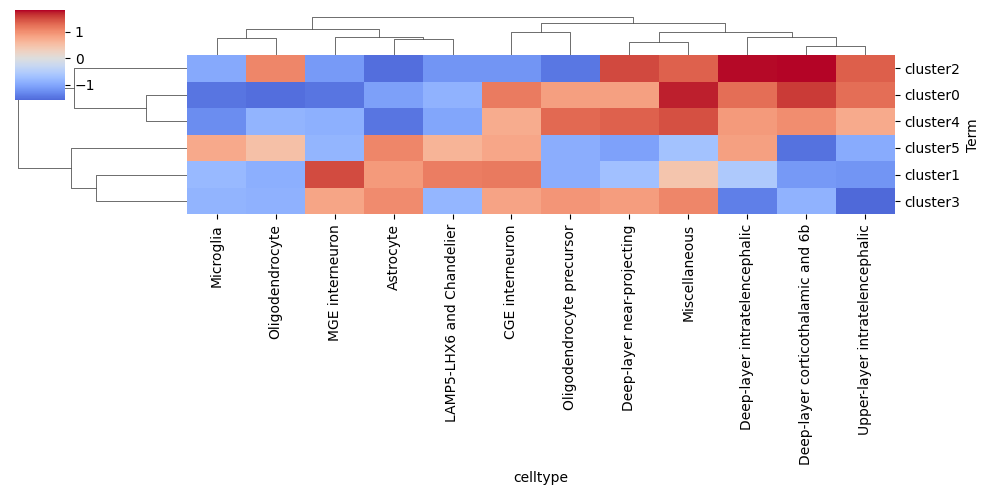

In [93]:
es_df = enrich_df.pivot(index='Term', columns='celltype', values='NES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

<Axes: xlabel='Term', ylabel='celltype'>

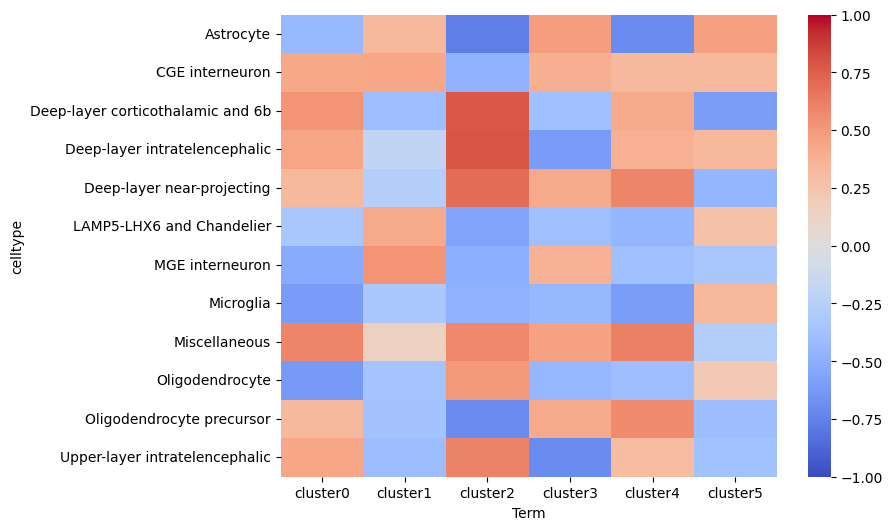

In [94]:
import seaborn as sns
fig = plt.figure(figsize=(8, 6))
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.heatmap(es_df.astype(float).T, cmap='coolwarm', center=0, vmin=-1, vmax=1)

### Wilcoxon

Specify DE test

In [95]:
key = 'wilcoxon'

Run enrichment for genesets

In [96]:
enrich_df = enrich_celltypes(celltypes, gene_sets, adata=adata_pb, key=key, gene_col='names', score_col='scores', method='lfc_product', gsea_kw={'verbose': False})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:34:10,853 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:12,300 [WARNING] Duplicated values found in preranked stats: 0.08% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:12,945 [WARNING] Duplicated values found in preranked stats: 0.09% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:13,565 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:14,207 [WARNING] Duplicated values found in preranked stats: 0.09% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:15,521 [WARNING] Duplicated values found in preranked stats: 0.07% of genes
The order of those genes will be

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,cluster4,-0.789315,-1.42126,0.042003,0.192836,0.165165,3/8,8.58%,IGSF21;ATP1A3;VAT1L,Astrocyte
1,prerank,cluster2,-0.751706,-1.278014,0.141431,0.314032,0.461461,3/7,13.39%,GNAI1;NUAK1;CX3CL1,Astrocyte


Process enrichment results

In [97]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,cluster4,-0.789315,-1.42126,0.042003,0.192836,0.165165,3/8,8.58%,IGSF21;ATP1A3;VAT1L,Astrocyte,0.712566,depleted,FDR >= 0.05
1,prerank,cluster2,-0.751706,-1.278014,0.141431,0.314032,0.461461,3/7,13.39%,GNAI1;NUAK1;CX3CL1,Astrocyte,0.501646,depleted,FDR >= 0.05


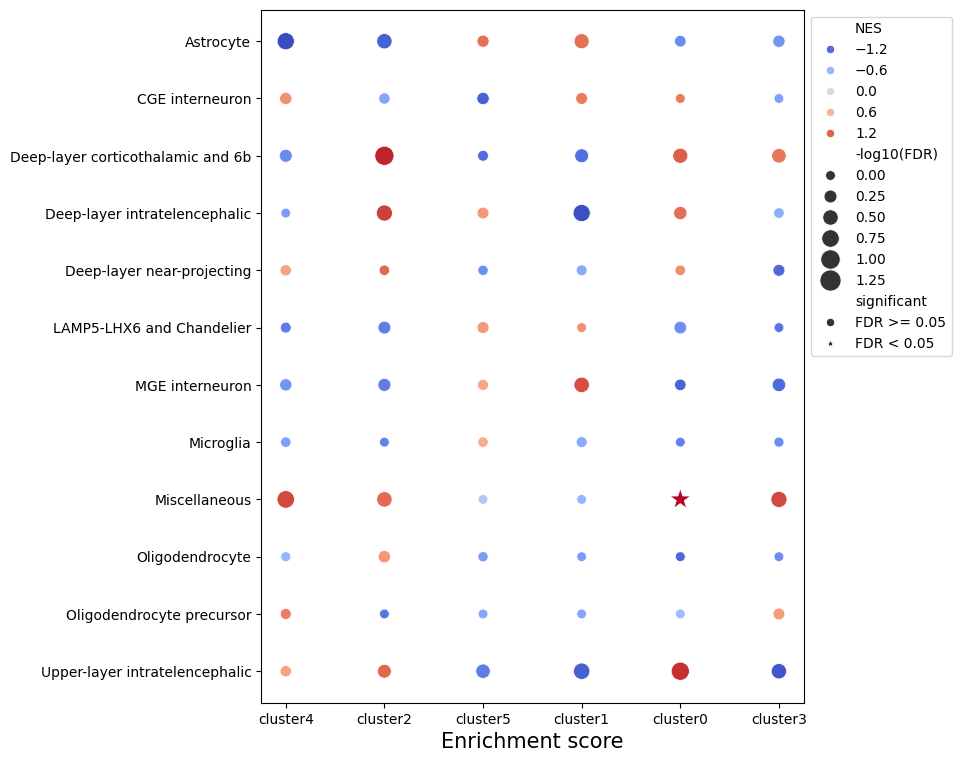

In [98]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='Term',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

C:\Users\claptar\AppData\Local\Temp\ipykernel_17936\2110194606.py:6: UserWarning: The palette list has more values (12) than needed (6), which may not be intended.
  ax = sns.scatterplot(data=enrich_res.reset_index(), **kw_scatterplot)


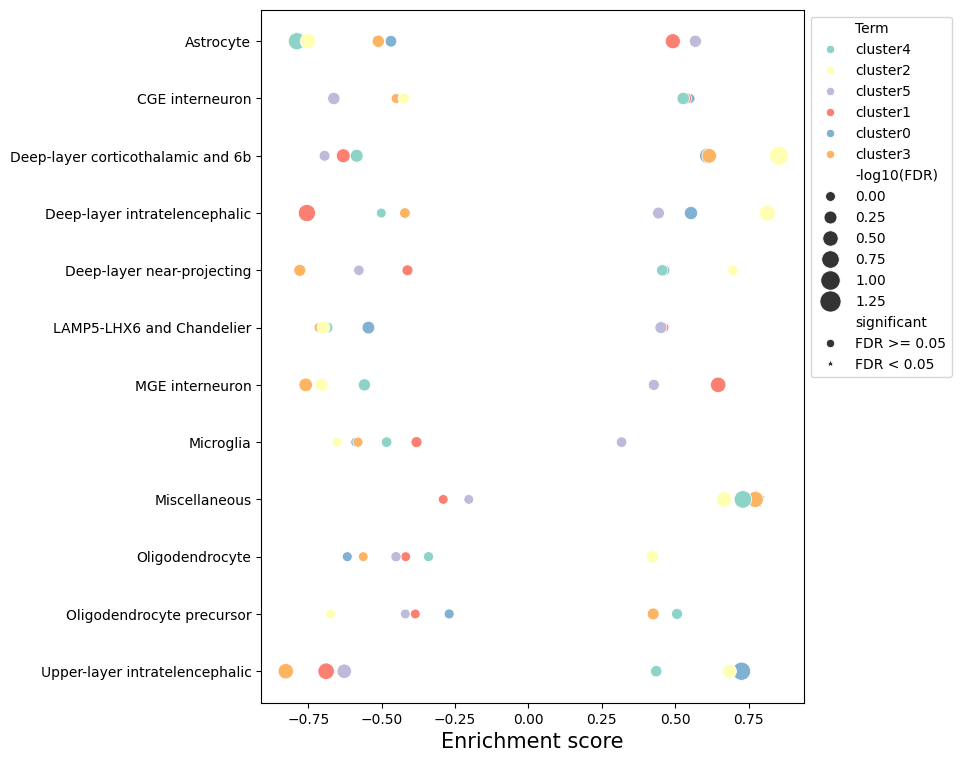

In [99]:
mpl.rcdefaults()
palette = sns.color_palette("Set3")

enrichment_plot(
    enrich_res=enrich_df,
    x='ES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='Term',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

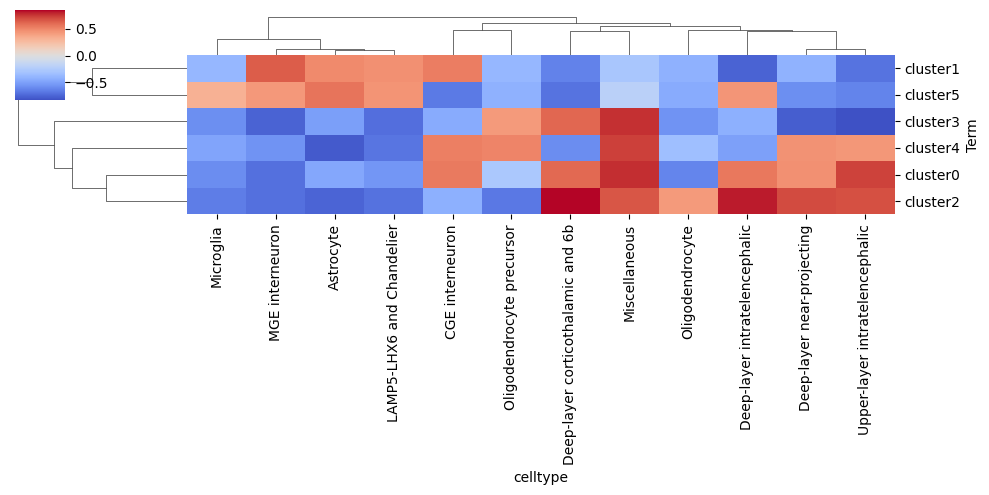

In [100]:
import seaborn as sns
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

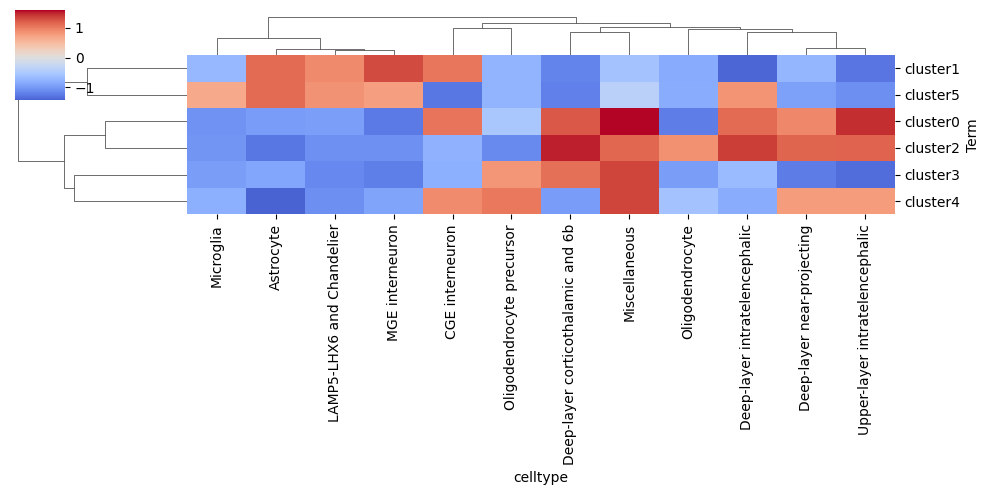

In [101]:
es_df = enrich_df.pivot(index='Term', columns='celltype', values='NES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

<Axes: xlabel='Term', ylabel='celltype'>

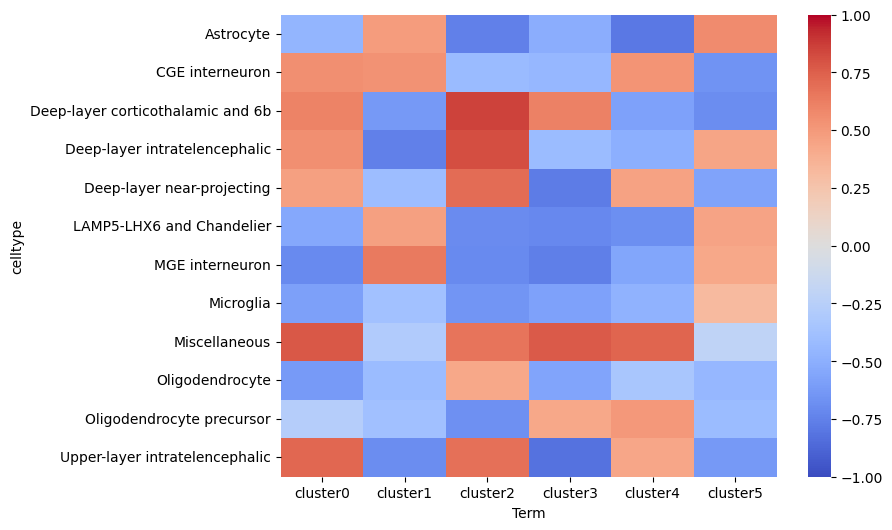

In [102]:
import seaborn as sns
fig = plt.figure(figsize=(8, 6))
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.heatmap(es_df.astype(float).T, cmap='coolwarm', center=0, vmin=-1, vmax=1)

### Logreg

Specify DE test

In [103]:
key = 'logreg'

Run enrichment for genesets

In [104]:
enrich_df = enrich_celltypes(celltypes, gene_sets, adata=adata_pb, key=key, gene_col='names', score_col='scores', method='score', gsea_kw={'verbose': False})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:34:20,421 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:21,157 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:21,835 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:22,510 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:23,187 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:23,927 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,cluster4,-0.78869,-1.476808,0.060041,0.122892,0.157407,4/8,6.90%,IGSF21;ATP1A3;VAT1L;CLSTN1,Astrocyte
1,prerank,cluster2,-0.76957,-1.428667,0.084967,0.085425,0.208848,4/7,16.95%,GNAI1;NUAK1;CX3CL1;OLA1,Astrocyte


Process enrichment results

In [105]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,cluster4,-0.78869,-1.476808,0.060041,0.122892,0.157407,4/8,6.90%,IGSF21;ATP1A3;VAT1L;CLSTN1,Astrocyte,0.906955,depleted,FDR >= 0.05
1,prerank,cluster2,-0.76957,-1.428667,0.084967,0.085425,0.208848,4/7,16.95%,GNAI1;NUAK1;CX3CL1;OLA1,Astrocyte,1.063359,depleted,FDR >= 0.05


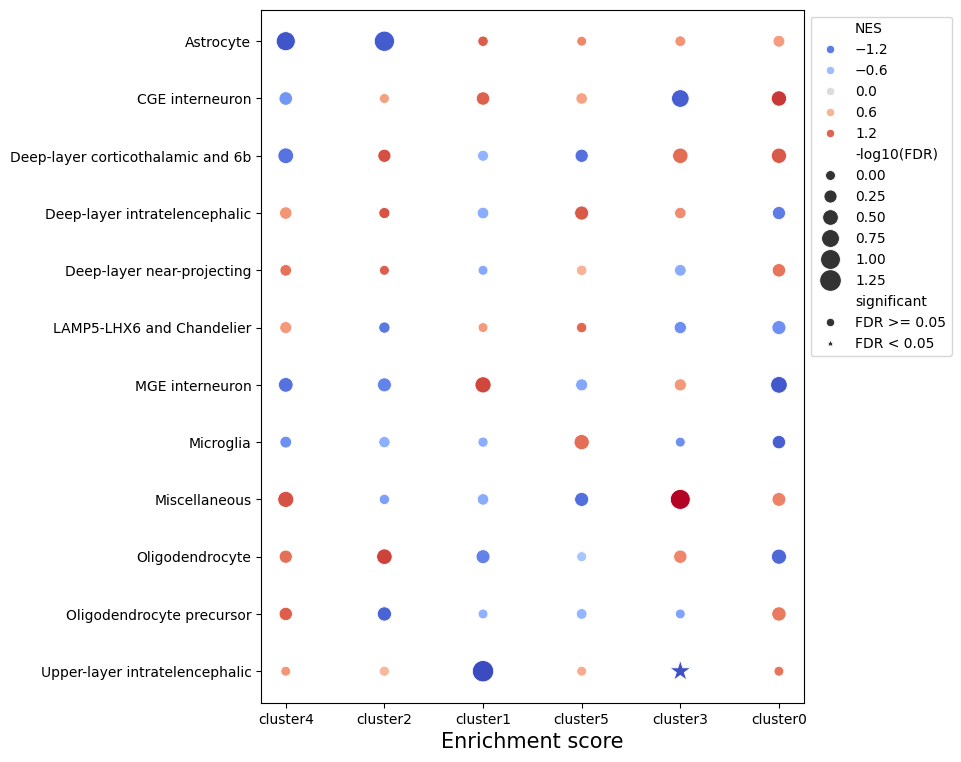

In [106]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='Term',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

C:\Users\claptar\AppData\Local\Temp\ipykernel_17936\2110194606.py:6: UserWarning: The palette list has more values (12) than needed (6), which may not be intended.
  ax = sns.scatterplot(data=enrich_res.reset_index(), **kw_scatterplot)


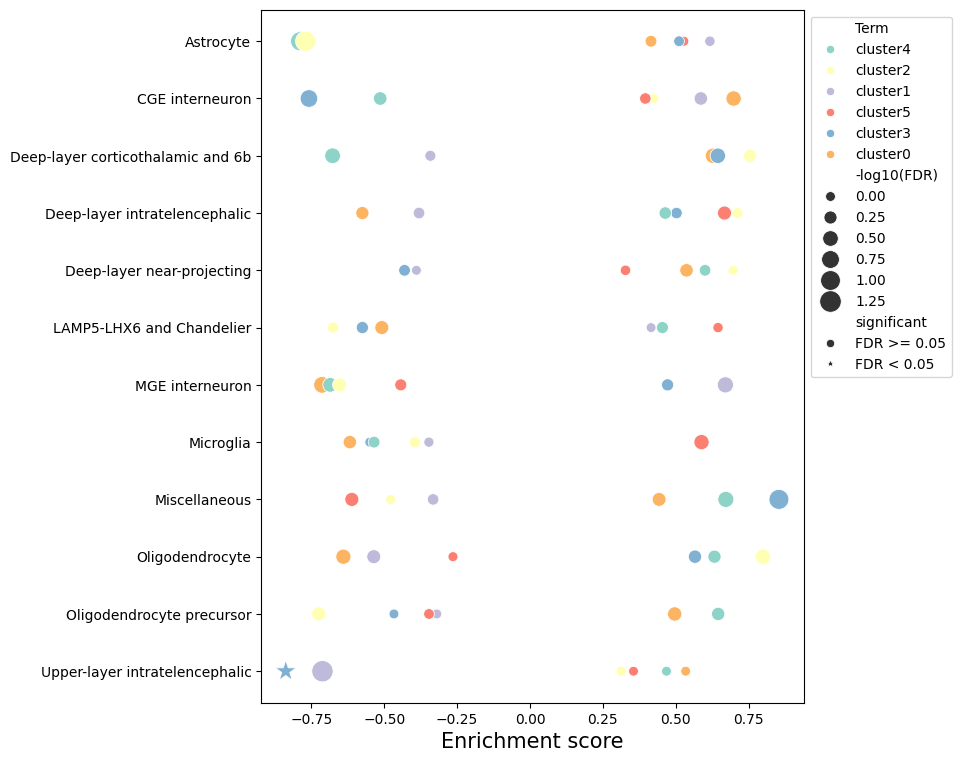

In [107]:
mpl.rcdefaults()
palette = sns.color_palette("Set3")

enrichment_plot(
    enrich_res=enrich_df,
    x='ES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='Term',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

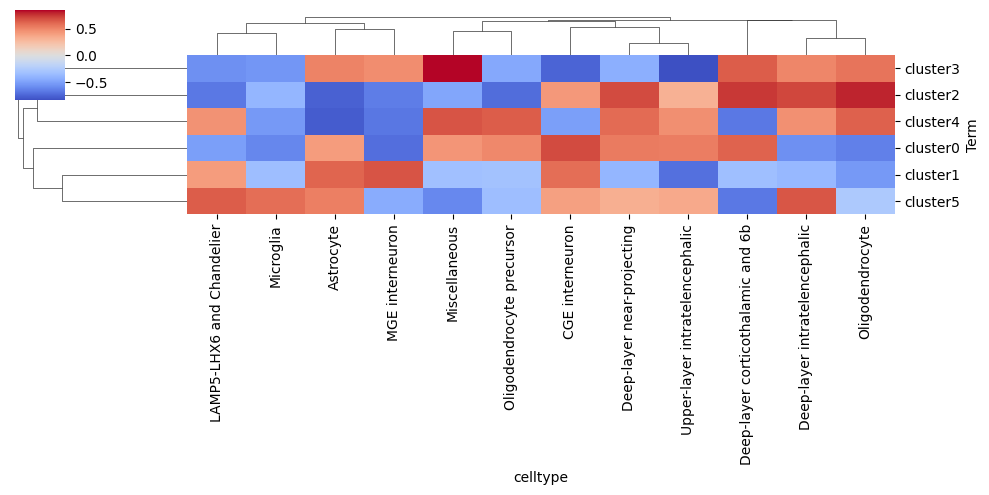

In [108]:
import seaborn as sns
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

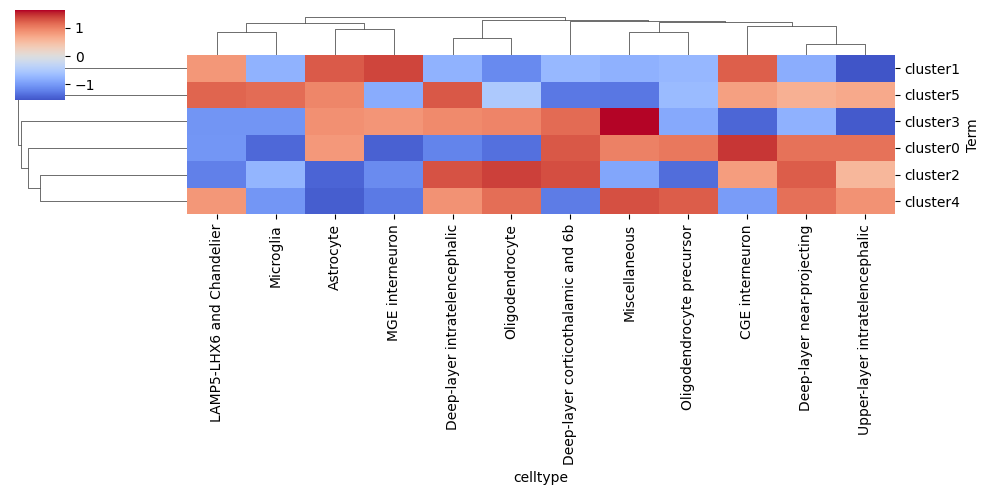

In [109]:
es_df = enrich_df.pivot(index='Term', columns='celltype', values='NES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

<Axes: xlabel='Term', ylabel='celltype'>

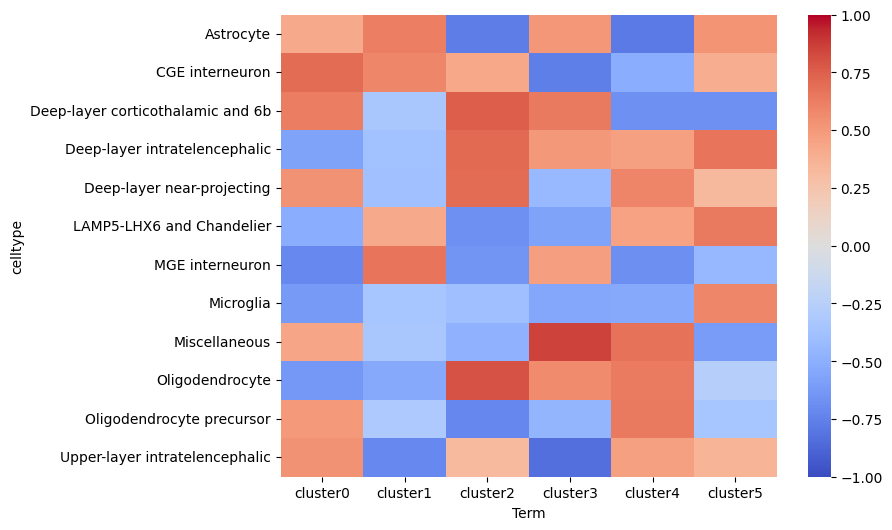

In [110]:
import seaborn as sns
fig = plt.figure(figsize=(8, 6))
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.heatmap(es_df.astype(float).T, cmap='coolwarm', center=0, vmin=-1, vmax=1)

### EdgeR

Run enrichment for genesets

In [111]:
enrich_df = enrich_celltypes(res_edgeR, gene_sets, gene_col='names', score_col='score', method='score', gsea_kw={'verbose': True})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:34:29,654 [WARNING] Duplicated values found in preranked stats: 2.44% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:29,655 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:34:29,657 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2024-07-30 17:34:29,658 [INFO] 0006 gene_sets used for further statistical testing.....
2024-07-30 17:34:29,659 [INFO] Start to run GSEA...Might take a while..................
2024-07-30 17:34:30,636 [INFO] Congratulations. GSEApy runs successfully................

2024-07-30 17:34:30,650 [WARNING] Duplicated values found in preranked stats: 0.91% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:30,651 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:34:30,654 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
20

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,cluster2,-0.882455,-1.410374,0.044872,0.124287,0.110312,4/7,8.16%,GNAI1;NUAK1;OLA1;CX3CL1,Astrocyte
1,prerank,cluster4,-0.791532,-1.291547,0.159744,0.170577,0.292566,4/8,9.26%,IGSF21;ATP1A3;CLSTN1;VAT1L,Astrocyte


Process enrichment results

In [112]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,cluster2,-0.882455,-1.410374,0.044872,0.124287,0.110312,4/7,8.16%,GNAI1;NUAK1;OLA1;CX3CL1,Astrocyte,0.902095,depleted,FDR >= 0.05
1,prerank,cluster4,-0.791532,-1.291547,0.159744,0.170577,0.292566,4/8,9.26%,IGSF21;ATP1A3;CLSTN1;VAT1L,Astrocyte,0.765541,depleted,FDR >= 0.05


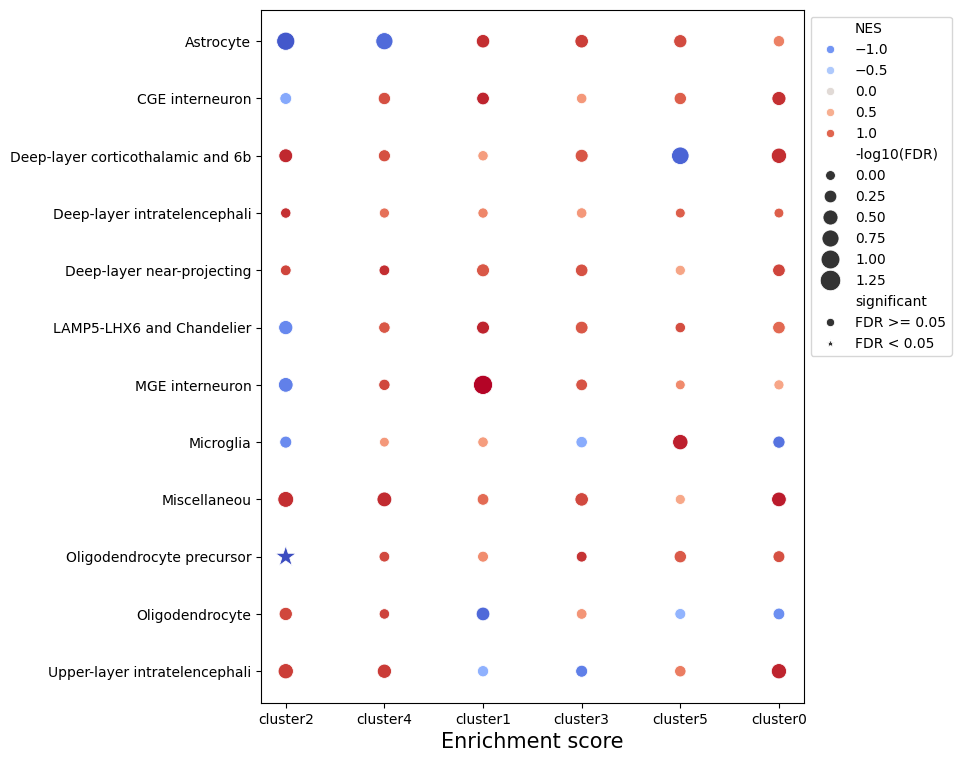

In [113]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='Term',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

C:\Users\claptar\AppData\Local\Temp\ipykernel_17936\2110194606.py:6: UserWarning: The palette list has more values (12) than needed (6), which may not be intended.
  ax = sns.scatterplot(data=enrich_res.reset_index(), **kw_scatterplot)


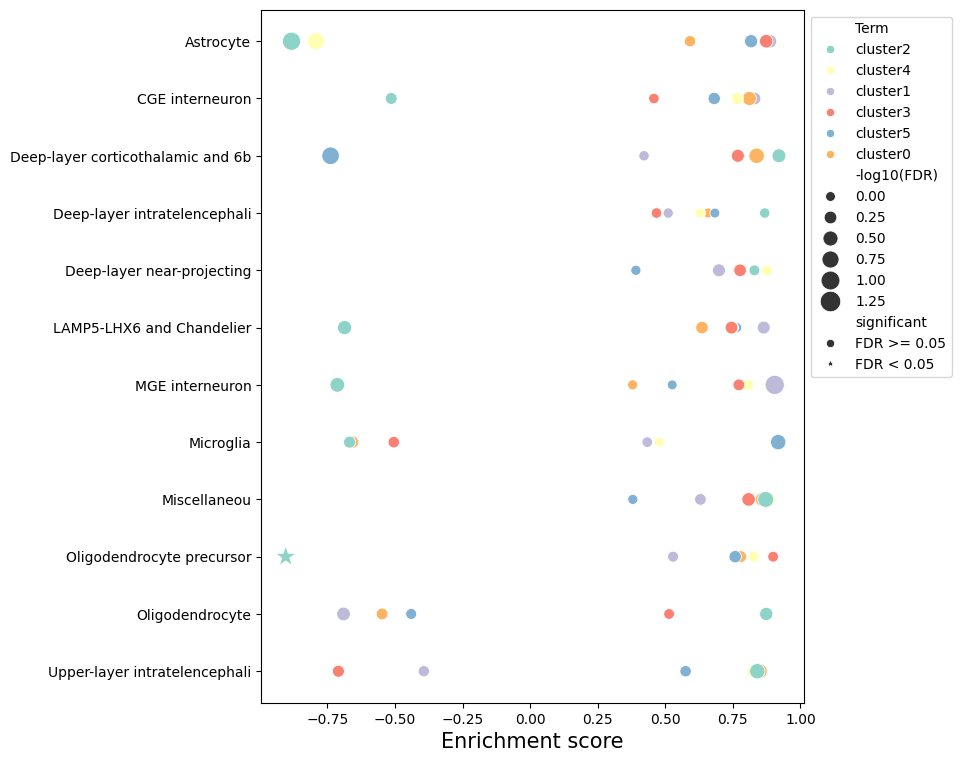

In [114]:
mpl.rcdefaults()
palette = sns.color_palette("Set3")

enrichment_plot(
    enrich_res=enrich_df,
    x='ES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='Term',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

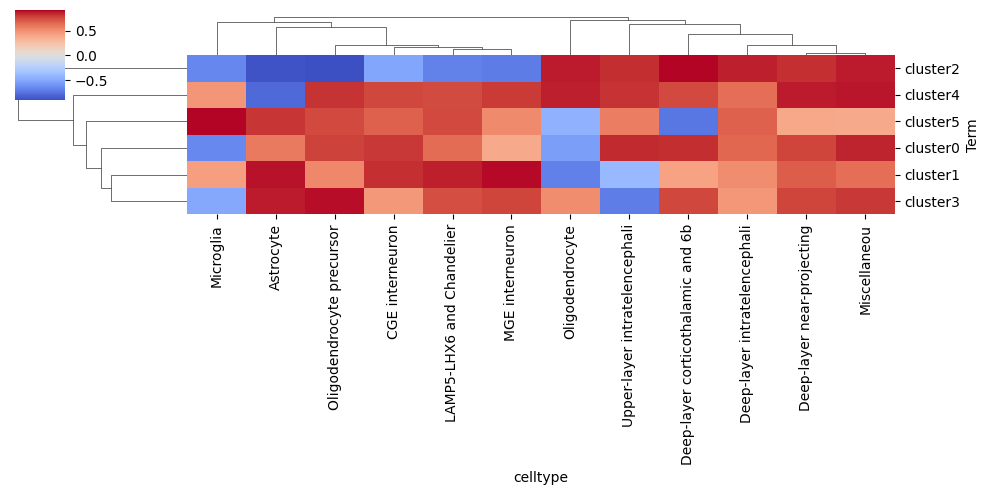

In [115]:
import seaborn as sns
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

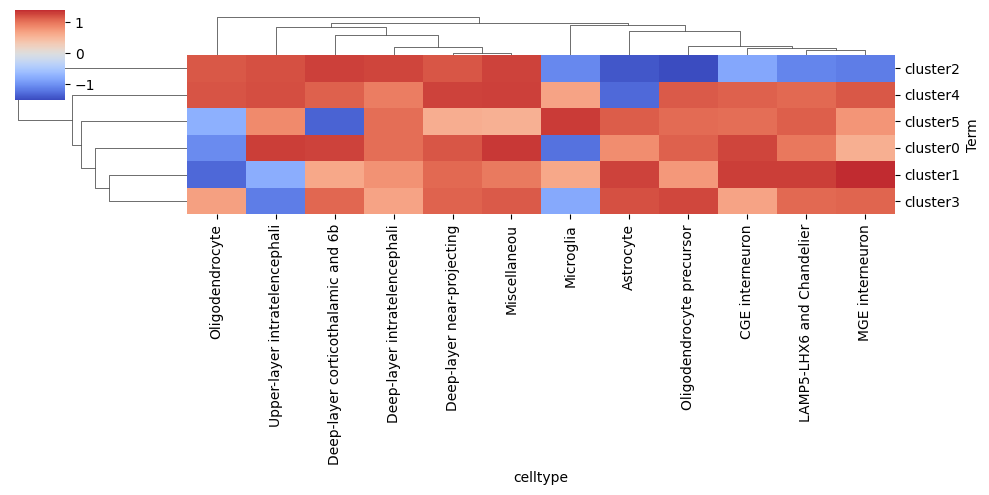

In [116]:
es_df = enrich_df.pivot(index='Term', columns='celltype', values='NES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

<Axes: xlabel='Term', ylabel='celltype'>

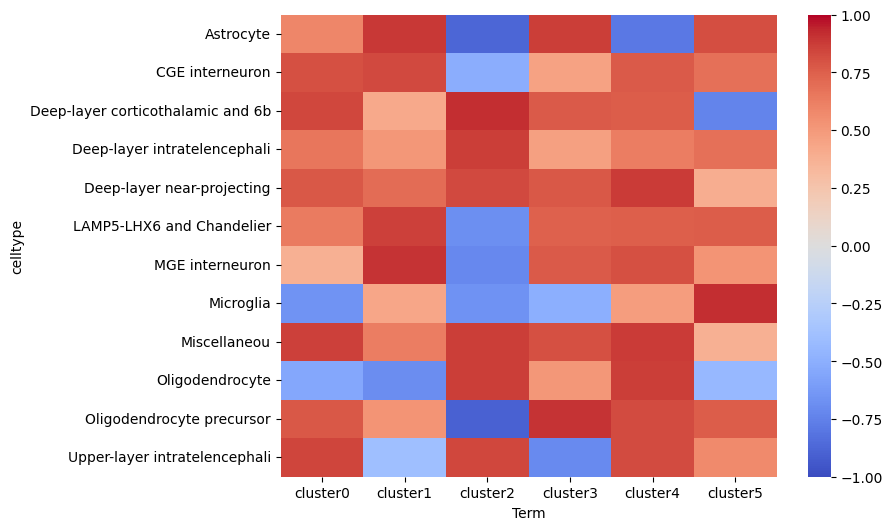

In [117]:
import seaborn as sns
fig = plt.figure(figsize=(8, 6))
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.heatmap(es_df.astype(float).T, cmap='coolwarm', center=0, vmin=-1, vmax=1)

### EdgeR (logFC)

Run enrichment for genesets

In [118]:
enrich_df = enrich_celltypes(res_edgeR, gene_sets, gene_col='names', score_col='logFC', method='score', gsea_kw={'verbose': True})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:34:41,686 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:34:41,692 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2024-07-30 17:34:41,694 [INFO] 0006 gene_sets used for further statistical testing.....
2024-07-30 17:34:41,695 [INFO] Start to run GSEA...Might take a while..................
2024-07-30 17:34:42,674 [INFO] Congratulations. GSEApy runs successfully................

2024-07-30 17:34:42,686 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:34:42,689 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2024-07-30 17:34:42,690 [INFO] 0006 gene_sets used for further statistical testing.....
2024-07-30 17:34:42,690 [INFO] Start to run GSEA...Might take a while..................
2024-07-30 17:34:43,447 [INFO] Congratulations. GSEApy runs successfully................

2024-07-30 17:34:43,459 [INFO] Parsing data files for GSEA............................

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,cluster2,-0.755942,-1.504328,0.046653,0.152354,0.102564,3/7,8.71%,GNAI1;NUAK1;CX3CL1,Astrocyte
1,prerank,cluster4,-0.698592,-1.408445,0.093555,0.17535,0.22359,5/8,15.99%,IGSF21;ATP1A3;VAT1L;CLSTN1;PCP4,Astrocyte


Process enrichment results

In [119]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,cluster2,-0.755942,-1.504328,0.046653,0.152354,0.102564,3/7,8.71%,GNAI1;NUAK1;CX3CL1,Astrocyte,0.814306,depleted,FDR >= 0.05
1,prerank,cluster4,-0.698592,-1.408445,0.093555,0.17535,0.22359,5/8,15.99%,IGSF21;ATP1A3;VAT1L;CLSTN1;PCP4,Astrocyte,0.753624,depleted,FDR >= 0.05


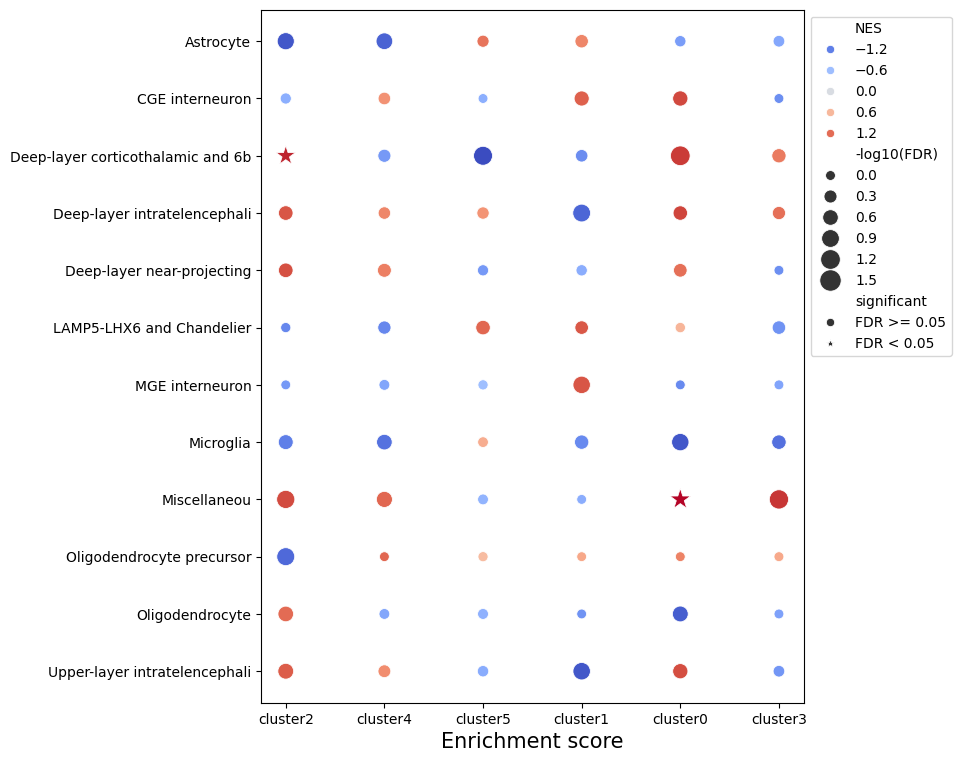

In [120]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='Term',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

C:\Users\claptar\AppData\Local\Temp\ipykernel_17936\2110194606.py:6: UserWarning: The palette list has more values (12) than needed (6), which may not be intended.
  ax = sns.scatterplot(data=enrich_res.reset_index(), **kw_scatterplot)


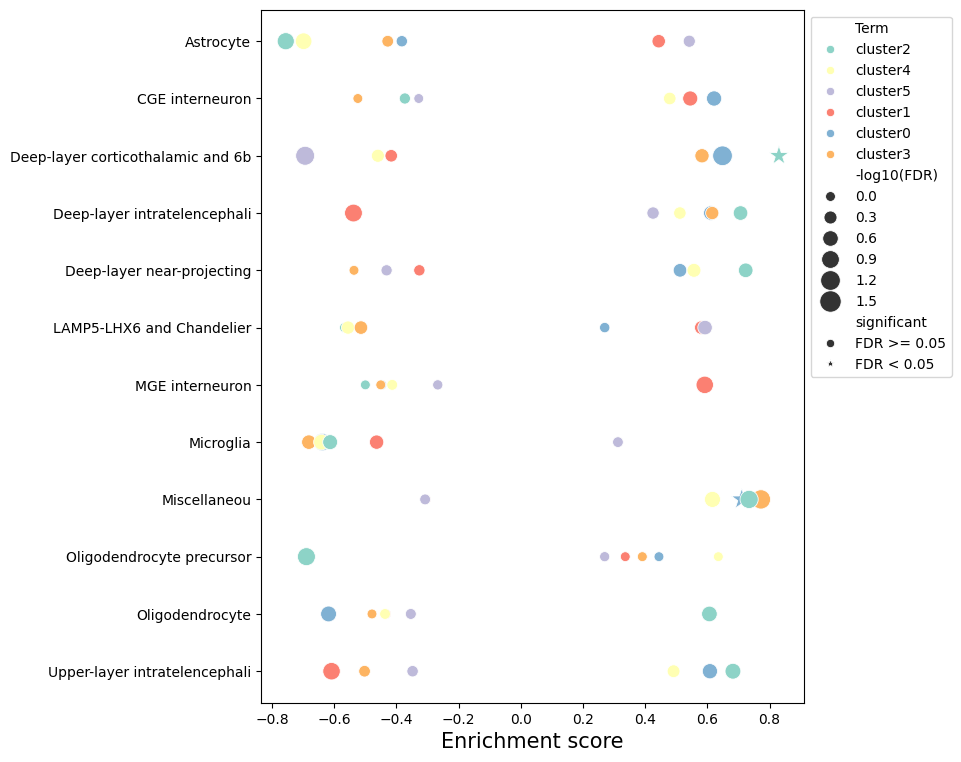

In [121]:
mpl.rcdefaults()
palette = sns.color_palette("Set3")

enrichment_plot(
    enrich_res=enrich_df,
    x='ES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='Term',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

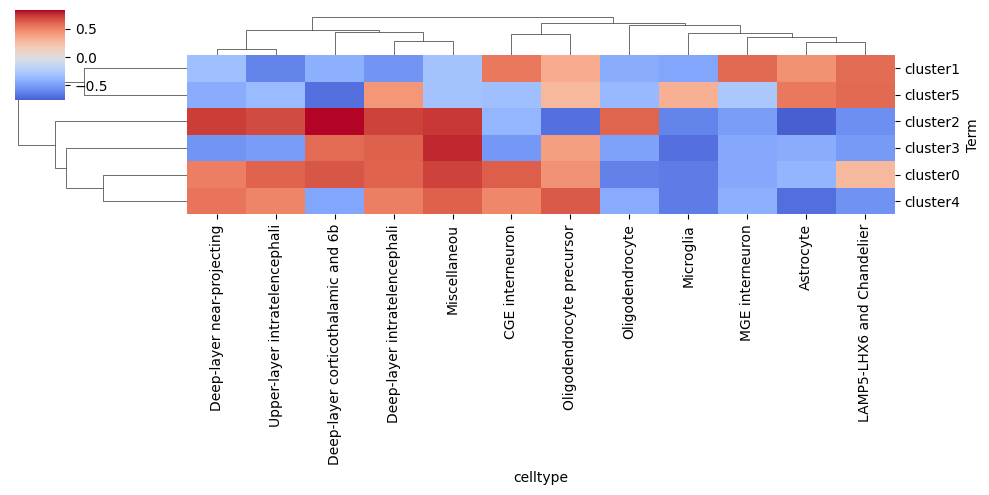

In [122]:
import seaborn as sns
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

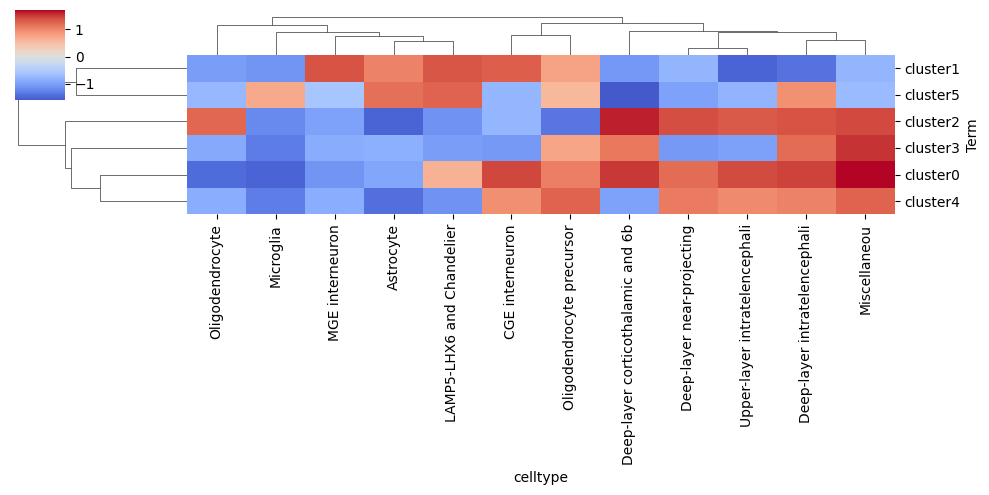

In [123]:
es_df = enrich_df.pivot(index='Term', columns='celltype', values='NES')
sns.clustermap(es_df.astype(float), figsize=(10, 5), cmap='coolwarm', center=0)

<Axes: xlabel='Term', ylabel='celltype'>

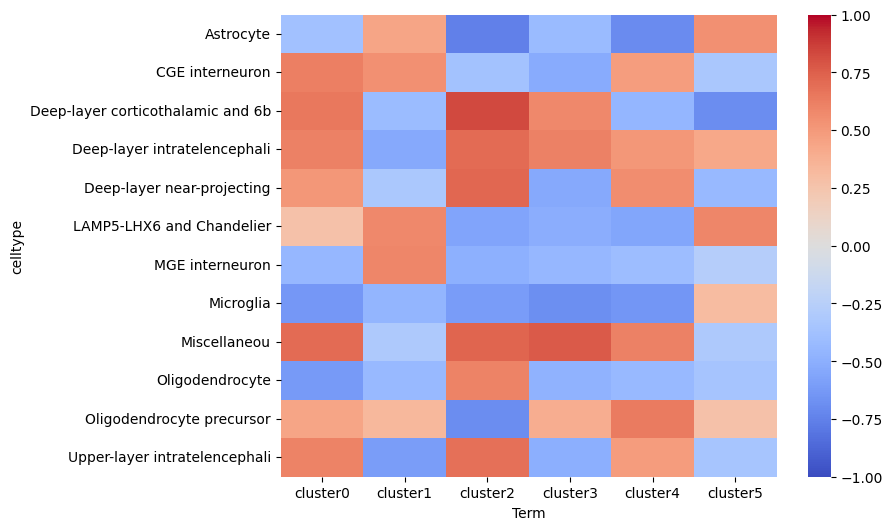

In [124]:
import seaborn as sns
fig = plt.figure(figsize=(8, 6))
es_df = enrich_df.pivot(index='Term', columns='celltype', values='ES')
sns.heatmap(es_df.astype(float).T, cmap='coolwarm', center=0, vmin=-1, vmax=1)

### Gene visualization

Calculate average normalized expression

In [125]:
for supercluster_term in gene_sets.keys():
    genes = scaled_adata.var_names.intersection(gene_sets[supercluster_term])
    scaled_adata.obs[f'{supercluster_term}_scaled'] = scaled_adata[:, genes].X.mean(axis=1)
scaled_adata.obs.head()

,roi,organism_ontology_term_id,disease_ontology_term_id,self_reported_ethnicity_ontology_term_id,assay_ontology_term_id,sex_ontology_term_id,development_stage_ontology_term_id,donor_id,suspension_type,dissection,...,age-specific_scaled,maybe age-specific_scaled,maybe human-specific_scaled,human-specific_scaled,cluster0_scaled,cluster1_scaled,cluster2_scaled,cluster3_scaled,cluster4_scaled,cluster5_scaled
CellID,,,,,,,,,,,,,,,,,,,,,
10X227_5:AACGGGATCCGCTGTT,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,0.130140,-0.112366,0.179321,-0.320138,-0.303805,0.038838,0.138339,0.495772,-0.064620,-0.047347
10X227_5:ATCATTCAGGCTTAGG,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,-0.459783,0.013721,-0.552547,0.032969,-0.417744,-0.406729,0.022565,-0.240545,0.066694,-0.507243
10X227_5:ACATCCCGTAGGAAAG,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,-0.420267,-0.172398,-0.198002,0.205507,-0.809277,-0.495485,0.747534,-0.170600,0.289071,-0.125595
10X227_5:CCATAAGTCCTGGCTT,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,-0.366426,-0.311726,0.332564,0.632647,-0.263477,0.041007,0.036851,0.196062,-0.114112,-0.135757
10X227_5:ATTCTTGGTACCAATC,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,-0.216217,-0.171606,-0.290054,-0.254880,-0.657864,-0.403971,0.670870,0.321785,-0.086527,-0.463981


Vusualize

In [126]:
scaled_adata.obs.columns

Index(['roi', 'organism_ontology_term_id', 'disease_ontology_term_id',
       'self_reported_ethnicity_ontology_term_id', 'assay_ontology_term_id',
       'sex_ontology_term_id', 'development_stage_ontology_term_id',
       'donor_id', 'suspension_type', 'dissection', 'fraction_mitochondrial',
       'fraction_unspliced', 'cell_cycle_score', 'total_genes', 'total_UMIs',
       'sample_id', 'supercluster_term', 'cluster_id', 'subcluster_id',
       'cell_type_ontology_term_id', 'tissue_ontology_term_id',
       'is_primary_data', 'tissue_type', 'cell_type', 'assay', 'disease',
       'organism', 'sex', 'tissue', 'self_reported_ethnicity',
       'development_stage', 'observation_joinid', 'All HS genes',
       'age-specific_scaled', 'maybe age-specific_scaled',
       'maybe human-specific_scaled', 'human-specific_scaled',
       'cluster0_scaled', 'cluster1_scaled', 'cluster2_scaled',
       'cluster3_scaled', 'cluster4_scaled', 'cluster5_scaled'],
      dtype='object')

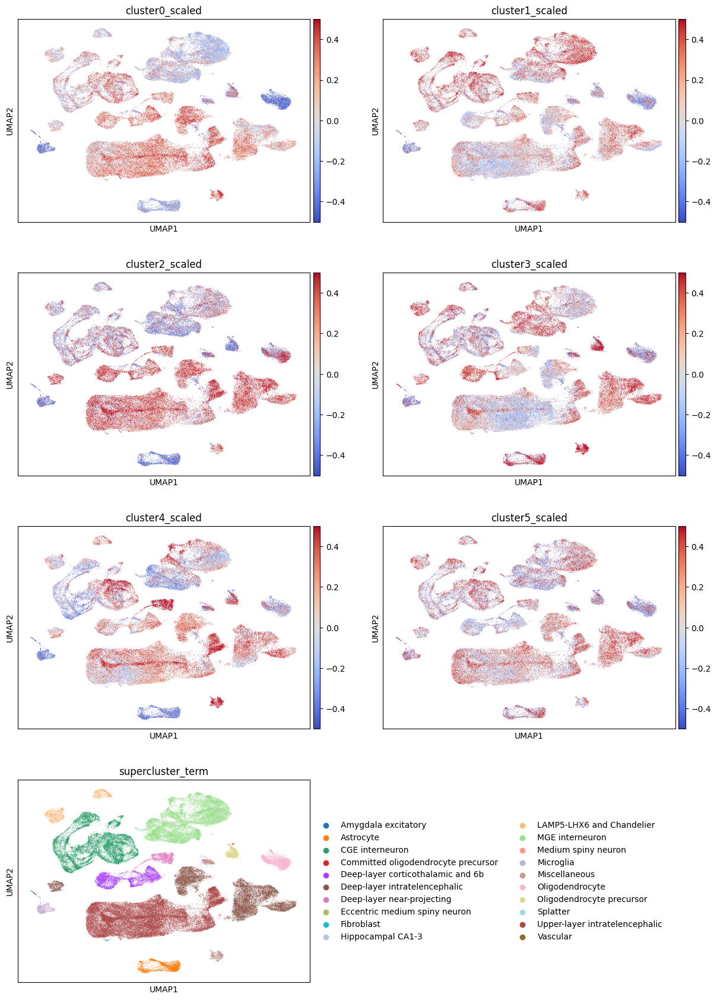

In [127]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmax=0.5, vmin=-0.5)
color = [
    'cluster0_scaled', 
    'cluster1_scaled',
    'cluster2_scaled', 
    'cluster3_scaled', 
    'cluster4_scaled',
    'cluster5_scaled', 
    'supercluster_term'
    ]

sc.pl.umap(scaled_adata, color=color, cmap=cmap, norm=norm, ncols=2)

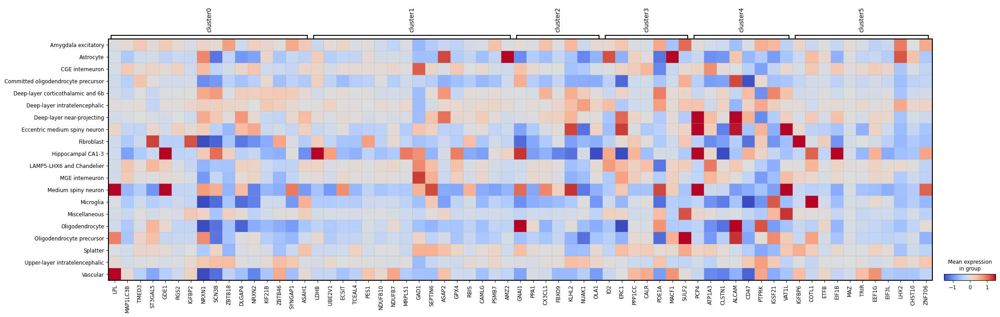

In [128]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmax=1.5, vmin=-1.5)
gene_sets_inter = {key: scaled_adata.var_names.intersection(value) for key, value in gene_sets.items()}

sc.pl.matrixplot(scaled_adata, gene_sets_inter, groupby='supercluster_term', cmap='coolwarm', norm=norm)

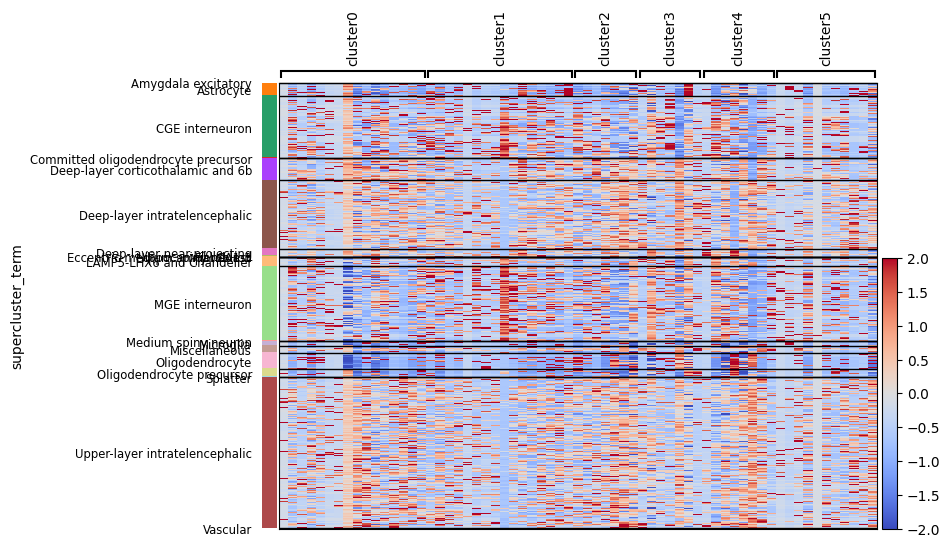

In [129]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmax=2, vmin=-2)
gene_sets_inter = {key: scaled_adata.var_names.intersection(value) for key, value in gene_sets.items()}

sc.pl.heatmap(scaled_adata, gene_sets_inter, groupby='supercluster_term', cmap='coolwarm', norm=norm)

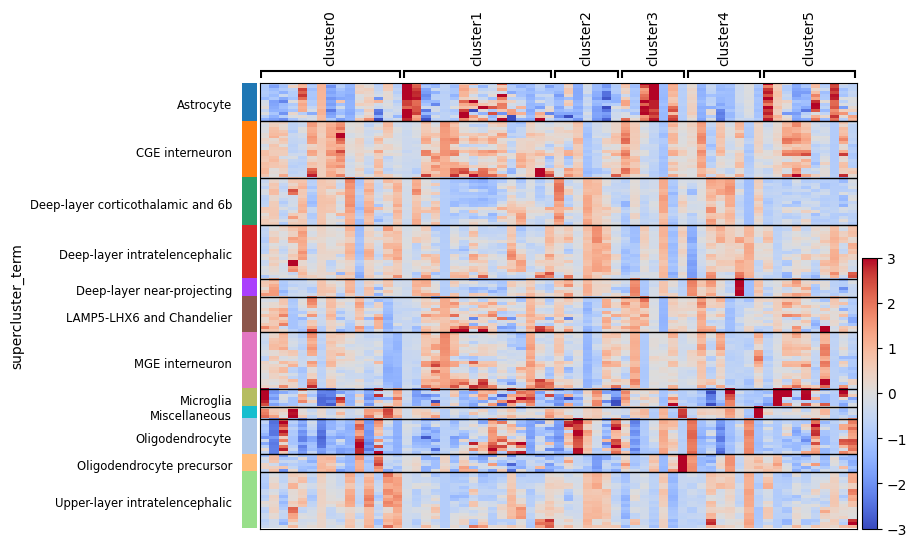

In [130]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0)
gene_sets_inter = {key: scaled_adata_pb.var_names.intersection(value) for key, value in gene_sets.items()}

sc.pl.heatmap(scaled_adata_pb, gene_sets_inter, groupby='supercluster_term', cmap='coolwarm', vcenter=0, vmin=-3, vmax=3)

## Enrichment for chimp-specific genes

Create a dict with genesets

In [131]:
geneset = {'chimp-specific genes': chimp_specific_genes}

### T-test

Specify DE test

In [132]:
key = 't-test'

Run enrichment for genesets

In [133]:
enrich_df = enrich_celltypes(celltypes, geneset, adata=adata_pb, key=key, gene_col='names', score_col='scores', method='score', gsea_kw={'verbose': False})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:34:57,855 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:58,427 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:59,055 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:34:59,691 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:00,746 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:01,348 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,chimp-specific genes,0.560408,1.391593,0.105618,0.105618,0.047,5/14,5.24%,SLC1A3;TPD52L1;MASP1;BCL6;HTRA1,Astrocyte
0,prerank,chimp-specific genes,-0.287776,-0.865529,0.655271,0.655271,0.655271,4/14,11.02%,SEMA3A;SLC1A3;SPARC;MASP1,CGE interneuron


Process enrichment results

In [134]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,chimp-specific genes,0.560408,1.391593,0.105618,0.105618,0.047,5/14,5.24%,SLC1A3;TPD52L1;MASP1;BCL6;HTRA1,Astrocyte,0.972170,enriched,FDR >= 0.05
0,prerank,chimp-specific genes,-0.287776,-0.865529,0.655271,0.655271,0.655271,4/14,11.02%,SEMA3A;SLC1A3;SPARC;MASP1,CGE interneuron,0.182917,depleted,FDR >= 0.05


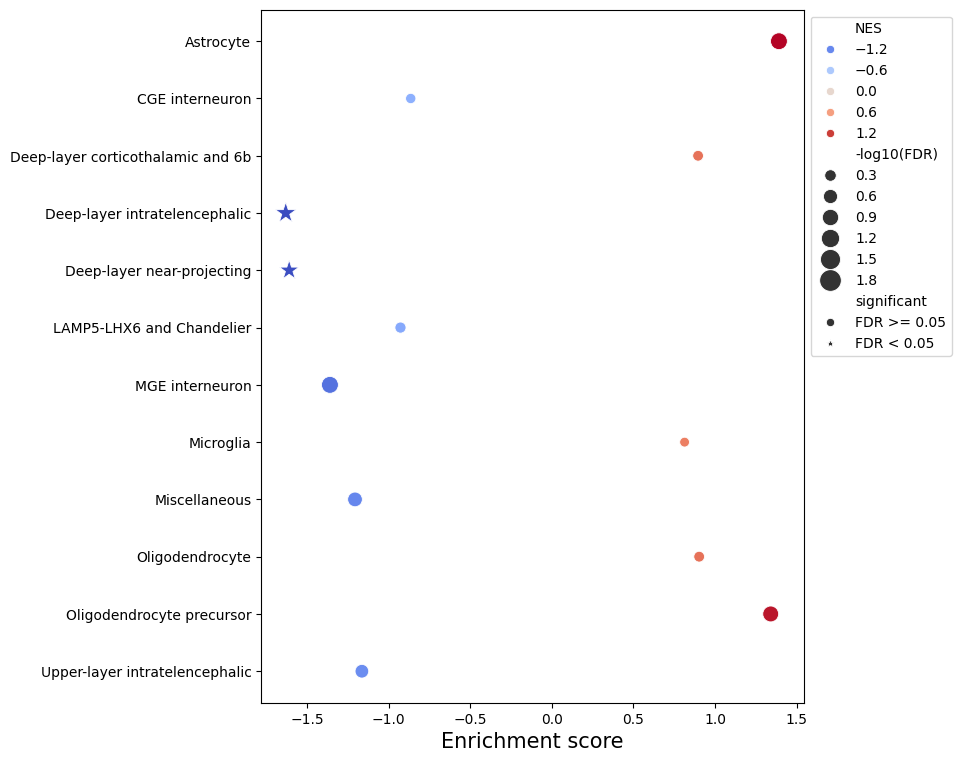

In [135]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='NES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

### Wilcoxon

Specify DE test

In [136]:
key = 'wilcoxon'

Run enrichment for genesets

In [137]:
enrich_df = enrich_celltypes(celltypes, geneset, adata=adata_pb, key=key, gene_col='names', score_col='scores', method='lfc_product', gsea_kw={'verbose': False})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:35:04,760 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:05,938 [WARNING] Duplicated values found in preranked stats: 0.08% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:06,496 [WARNING] Duplicated values found in preranked stats: 0.09% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:07,033 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:07,610 [WARNING] Duplicated values found in preranked stats: 0.09% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:08,758 [WARNING] Duplicated values found in preranked stats: 0.07% of genes
The order of those genes will be

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,chimp-specific genes,0.598957,1.326296,0.119777,0.119777,0.043,5/14,7.40%,SLC1A3;TPD52L1;MASP1;BCL6;HTRA1,Astrocyte
0,prerank,chimp-specific genes,-0.501012,-1.003011,0.457995,0.457995,0.457995,3/14,5.11%,MASP1;SEMA3A;SLC1A3,CGE interneuron


Process enrichment results

In [138]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,chimp-specific genes,0.598957,1.326296,0.119777,0.119777,0.043,5/14,7.40%,SLC1A3;TPD52L1;MASP1;BCL6;HTRA1,Astrocyte,0.918015,enriched,FDR >= 0.05
0,prerank,chimp-specific genes,-0.501012,-1.003011,0.457995,0.457995,0.457995,3/14,5.11%,MASP1;SEMA3A;SLC1A3,CGE interneuron,0.338192,depleted,FDR >= 0.05


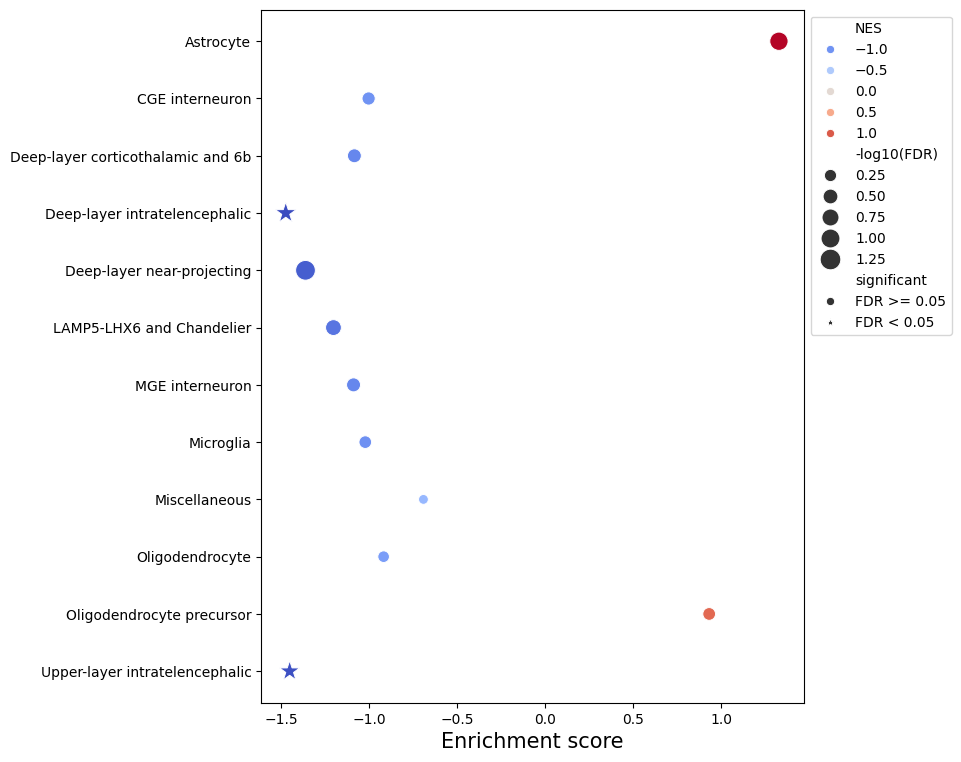

In [139]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='NES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

### Logreg

Specify DE test

In [140]:
key = 'logreg'

Run enrichment for genesets

In [141]:
enrich_df = enrich_celltypes(celltypes, geneset, adata=adata_pb, key=key, gene_col='names', score_col='scores', method='score', gsea_kw={'verbose': False})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:35:11,500 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:11,959 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:12,474 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:12,989 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:13,509 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:14,029 [WARNING] Duplicated values found in preranked stats: 0.01% of genes
The order of those genes will be

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,chimp-specific genes,0.631822,1.244022,0.207904,0.207904,0.121,7/14,10.41%,SLC1A3;TPD52L1;BCL6;SEMA3A;HTRA1;MASP1;BPTF,Astrocyte
0,prerank,chimp-specific genes,0.557662,1.121633,0.332734,0.332734,0.185,7/14,10.96%,RIPOR2;TPD52L1;HTRA1;BCL6;ANK3;BPTF;ARF5,CGE interneuron


Process enrichment results

In [142]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,chimp-specific genes,0.631822,1.244022,0.207904,0.207904,0.121,7/14,10.41%,SLC1A3;TPD52L1;BCL6;SEMA3A;HTRA1;MASP1;BPTF,Astrocyte,0.680054,enriched,FDR >= 0.05
0,prerank,chimp-specific genes,0.557662,1.121633,0.332734,0.332734,0.185,7/14,10.96%,RIPOR2;TPD52L1;HTRA1;BCL6;ANK3;BPTF;ARF5,CGE interneuron,0.476600,enriched,FDR >= 0.05


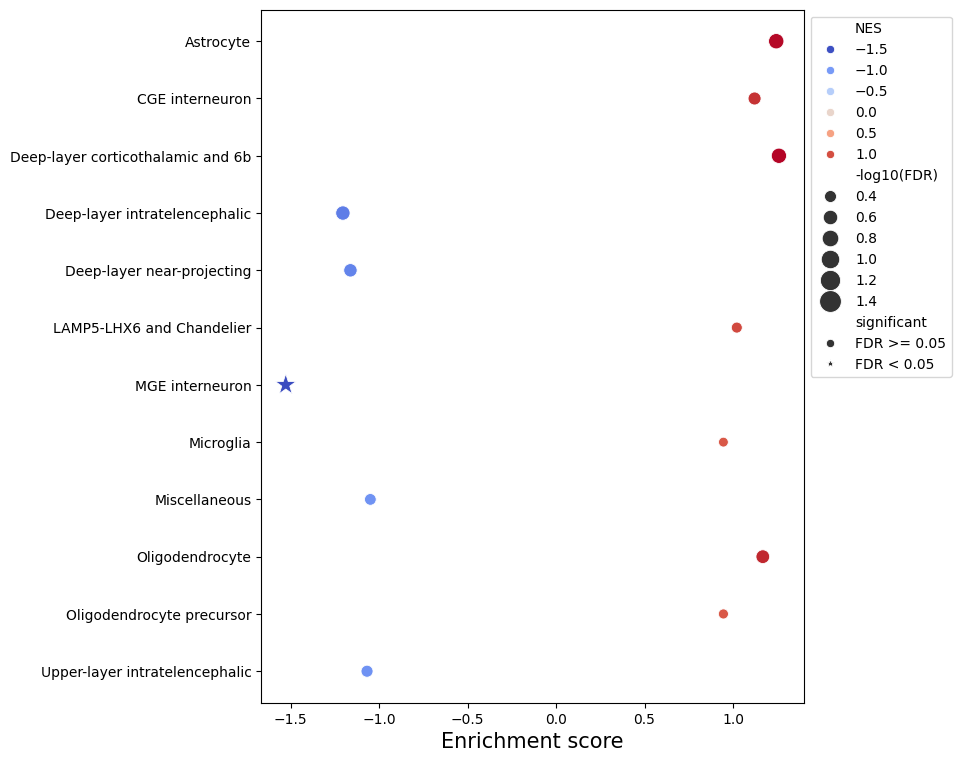

In [143]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='NES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

### EdgeR

Run enrichment for genesets

In [144]:
enrich_df = enrich_celltypes(res_edgeR, geneset, gene_col='names', score_col='score', method='score', gsea_kw={'verbose': True})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:35:17,867 [WARNING] Duplicated values found in preranked stats: 2.44% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:17,868 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:35:17,871 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2024-07-30 17:35:17,873 [INFO] 0001 gene_sets used for further statistical testing.....
2024-07-30 17:35:17,874 [INFO] Start to run GSEA...Might take a while..................
2024-07-30 17:35:18,502 [INFO] Congratulations. GSEApy runs successfully................

2024-07-30 17:35:18,513 [WARNING] Duplicated values found in preranked stats: 0.91% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2024-07-30 17:35:18,514 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:35:18,516 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
20

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,chimp-specific genes,0.941248,1.32222,0.032581,0.032581,0.026,5/14,3.68%,SLC1A3;TPD52L1;BCL6;HTRA1;MASP1,Astrocyte
0,prerank,chimp-specific genes,0.86542,1.324364,0.095979,0.095979,0.074,5/14,7.46%,RIPOR2;HTRA1;TPD52L1;BCL6;ANK3,CGE interneuron


Process enrichment results

In [145]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,chimp-specific genes,0.941248,1.32222,0.032581,0.032581,0.026,5/14,3.68%,SLC1A3;TPD52L1;BCL6;HTRA1;MASP1,Astrocyte,1.473901,enriched,FDR < 0.05
0,prerank,chimp-specific genes,0.86542,1.324364,0.095979,0.095979,0.074,5/14,7.46%,RIPOR2;HTRA1;TPD52L1;BCL6;ANK3,CGE interneuron,1.013321,enriched,FDR >= 0.05


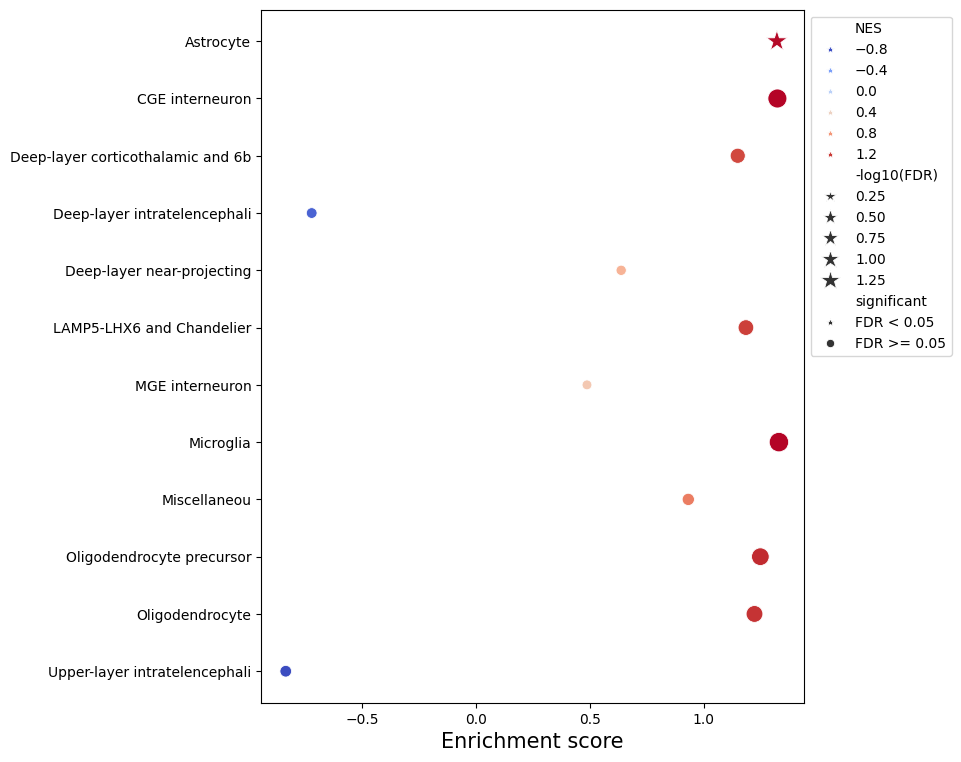

In [146]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='NES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

### EdgeR (logFC)

Run enrichment for genesets

In [147]:
enrich_df = enrich_celltypes(res_edgeR, geneset, gene_col='names', score_col='logFC', method='score', gsea_kw={'verbose': True})
enrich_df.head(2)

  0%|          | 0/12 [00:00<?, ?it/s]

2024-07-30 17:35:26,273 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:35:26,278 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2024-07-30 17:35:26,279 [INFO] 0001 gene_sets used for further statistical testing.....
2024-07-30 17:35:26,279 [INFO] Start to run GSEA...Might take a while..................
2024-07-30 17:35:26,931 [INFO] Congratulations. GSEApy runs successfully................

2024-07-30 17:35:26,940 [INFO] Parsing data files for GSEA.............................
2024-07-30 17:35:26,943 [INFO] 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2024-07-30 17:35:26,943 [INFO] 0001 gene_sets used for further statistical testing.....
2024-07-30 17:35:26,944 [INFO] Start to run GSEA...Might take a while..................
2024-07-30 17:35:27,583 [INFO] Congratulations. GSEApy runs successfully................

2024-07-30 17:35:27,594 [INFO] Parsing data files for GSEA............................

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype
0,prerank,chimp-specific genes,0.656988,1.477364,0.051878,0.051878,0.029,6/14,5.27%,SLC1A3;TPD52L1;BCL6;HTRA1;MASP1;SEMA3A,Astrocyte
0,prerank,chimp-specific genes,0.427569,0.940738,0.558484,0.558484,0.339,5/14,8.03%,RIPOR2;TPD52L1;HTRA1;ANK3;BCL6,CGE interneuron


Process enrichment results

In [148]:
process_enrichment_df(enrich_df)
enrich_df.head(2)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,celltype,-log10(FDR),direction,significant
0,prerank,chimp-specific genes,0.656988,1.477364,0.051878,0.051878,0.029,6/14,5.27%,SLC1A3;TPD52L1;BCL6;HTRA1;MASP1;SEMA3A,Astrocyte,1.276722,enriched,FDR >= 0.05
0,prerank,chimp-specific genes,0.427569,0.940738,0.558484,0.558484,0.339,5/14,8.03%,RIPOR2;TPD52L1;HTRA1;ANK3;BCL6,CGE interneuron,0.252212,enriched,FDR >= 0.05


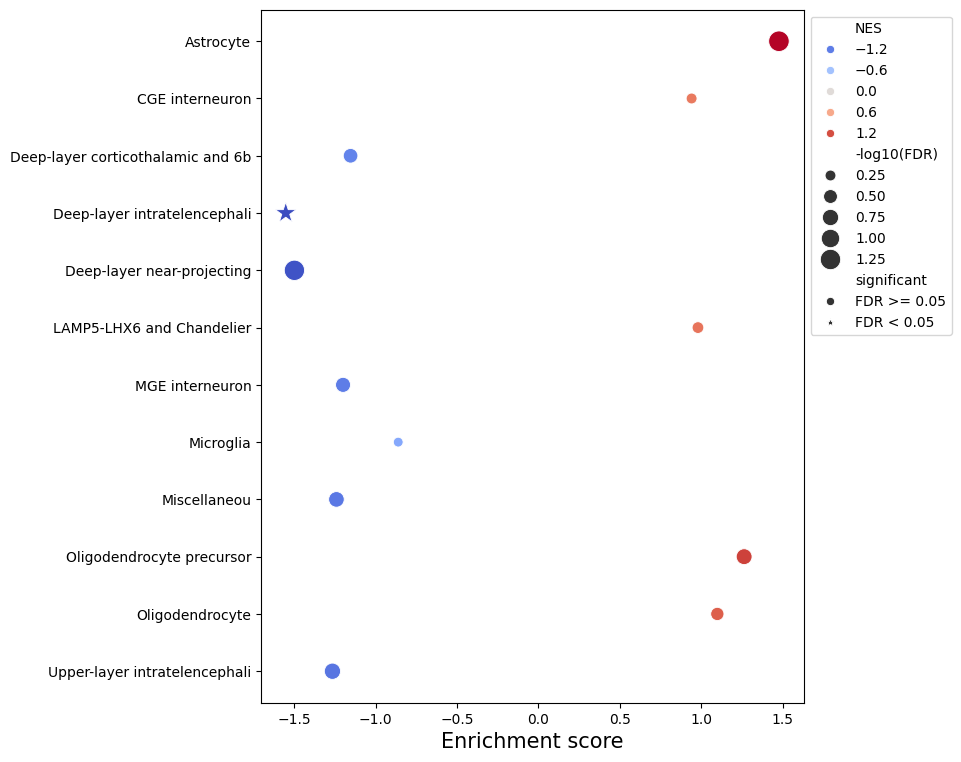

In [149]:
mpl.rcdefaults()
palette = sns.color_palette("coolwarm", as_cmap=True)

enrichment_plot(
    enrich_res=enrich_df,
    x='NES',
    y='celltype',
    size='-log10(FDR)',
    sizes=(50, 250),
    hue='NES',
    palette=palette,
    style='significant',
    markers={'FDR < 0.05': '*', 'FDR >= 0.05': 'o'}
)

### Gene visualization

Calculate average normalized expression

In [150]:
genes = scaled_adata.var_names.intersection(chimp_specific_genes)
scaled_adata.obs[f'chimp_specific_scaled'] = scaled_adata[:, genes].X.mean(axis=1)
scaled_adata.obs.head()

,roi,organism_ontology_term_id,disease_ontology_term_id,self_reported_ethnicity_ontology_term_id,assay_ontology_term_id,sex_ontology_term_id,development_stage_ontology_term_id,donor_id,suspension_type,dissection,...,maybe age-specific_scaled,maybe human-specific_scaled,human-specific_scaled,cluster0_scaled,cluster1_scaled,cluster2_scaled,cluster3_scaled,cluster4_scaled,cluster5_scaled,chimp_specific_scaled
CellID,,,,,,,,,,,,,,,,,,,,,
10X227_5:AACGGGATCCGCTGTT,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,-0.112366,0.179321,-0.320138,-0.303805,0.038838,0.138339,0.495772,-0.064620,-0.047347,-0.071184
10X227_5:ATCATTCAGGCTTAGG,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,0.013721,-0.552547,0.032969,-0.417744,-0.406729,0.022565,-0.240545,0.066694,-0.507243,-0.276833
10X227_5:ACATCCCGTAGGAAAG,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,-0.172398,-0.198002,0.205507,-0.809277,-0.495485,0.747534,-0.170600,0.289071,-0.125595,0.517537
10X227_5:CCATAAGTCCTGGCTT,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,-0.311726,0.332564,0.632647,-0.263477,0.041007,0.036851,0.196062,-0.114112,-0.135757,-0.032152
10X227_5:ATTCTTGGTACCAATC,Human A24,NCBITaxon:9606,PATO:0000461,HANCESTRO:0005,EFO:0009922,PATO:0000384,HsapDv:0000144,H18.30.002,nucleus,"Cerebral cortex (Cx) - Cingulate gyrus, rostra...",...,-0.171606,-0.290054,-0.254880,-0.657864,-0.403971,0.670870,0.321785,-0.086527,-0.463981,-0.261341


Vusualize

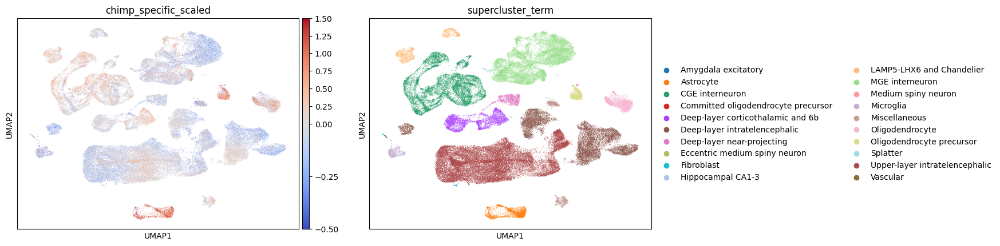

In [151]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmax=1.5, vmin=-0.5)

sc.pl.umap(scaled_adata, color=['chimp_specific_scaled', 'supercluster_term'], cmap=cmap, norm=norm)

In [152]:
gene_sets = dict()
for label in chimp_cluster_groups.label.unique():
  gene_sets[f'cluster{label}'] = chimp_cluster_groups[chimp_cluster_groups.label == label].index.to_list()

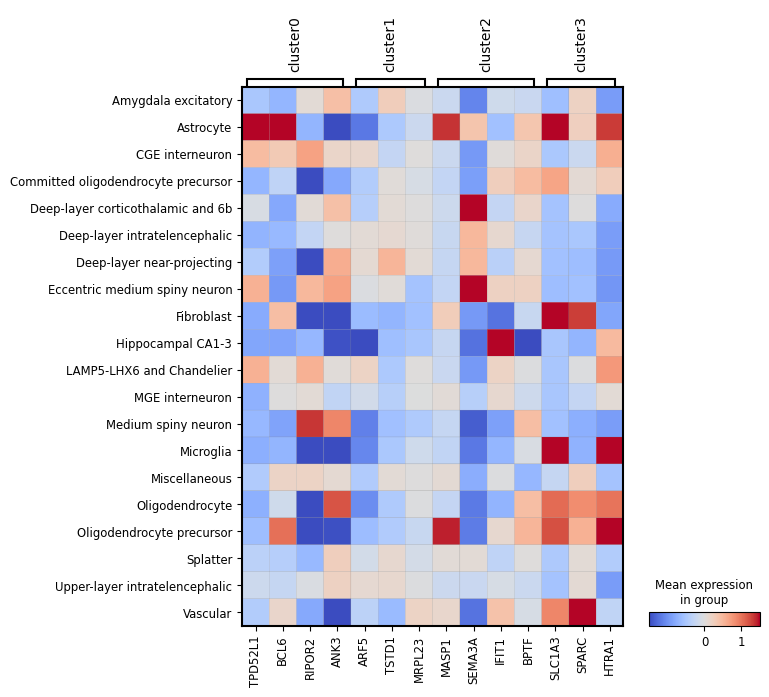

In [153]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmax=1.5, vmin=-1.5)
gene_sets_inter = {key: scaled_adata.var_names.intersection(value) for key, value in gene_sets.items()}

sc.pl.matrixplot(scaled_adata, gene_sets_inter, groupby='supercluster_term', cmap='coolwarm', vcenter=0, vmin=-0.7, vmax=1.5)

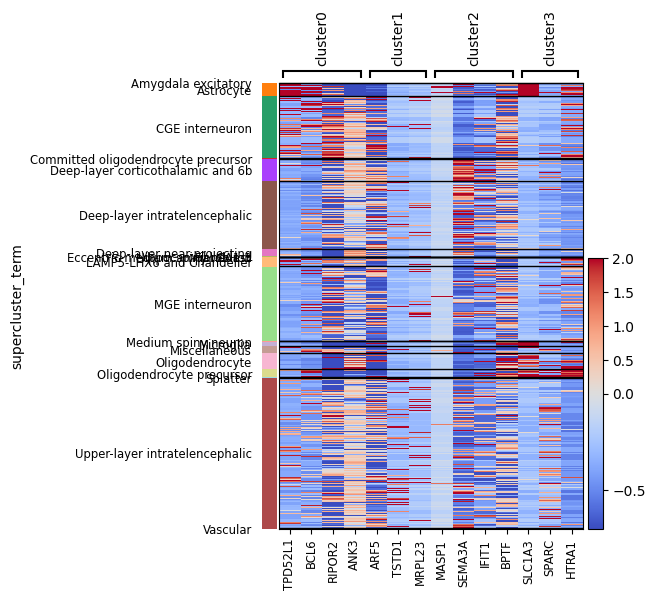

In [154]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0, vmax=2, vmin=-2)
gene_sets_inter = {key: scaled_adata.var_names.intersection(value) for key, value in gene_sets.items()}

sc.pl.heatmap(scaled_adata, gene_sets_inter, groupby='supercluster_term', cmap='coolwarm', vcenter=0, vmin=-0.7, vmax=2)

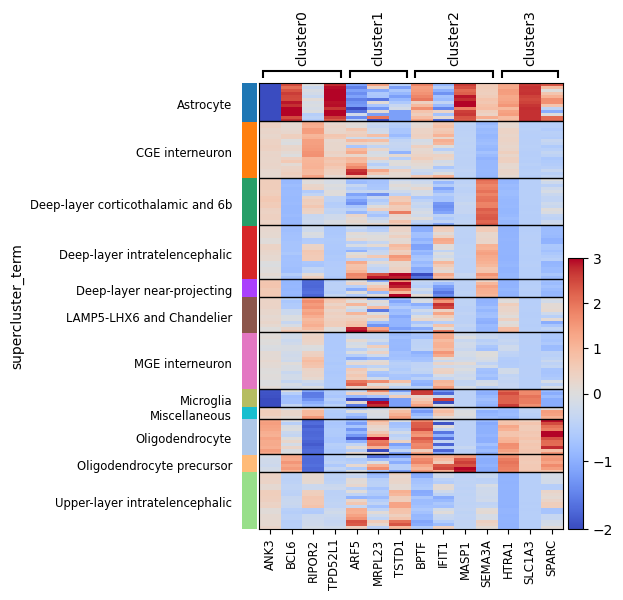

In [155]:
cmap = mpl.cm.coolwarm
norm = mpl.colors.TwoSlopeNorm(vcenter=0)
gene_sets_inter = {key: scaled_adata_pb.var_names.intersection(value) for key, value in gene_sets.items()}

sc.pl.heatmap(scaled_adata_pb, gene_sets_inter, groupby='supercluster_term', cmap='coolwarm', vcenter=0, vmin=-2, vmax=3)